In [1]:
%matplotlib inline

#ignoring warnings
import warnings
warnings.filterwarnings('ignore')

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.models import load_model

import os

In [2]:
epochs = 15

In [3]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "VegNet",
    seed=85,
    # To randomly shuffle all the images
    shuffle=True,
    # Input image size
    image_size=(256, 256),
    # Set batch size to 32
    batch_size=32
)

Found 6150 files belonging to 19 classes.


In [4]:
class_names = dataset.class_names
class_names

['Bell Pepper-Damaged',
 'Bell Pepper-Dried',
 'Bell Pepper-Old',
 'Bell Pepper-Ripe',
 'Bell Pepper-Unripe',
 'Chile Pepper-Damaged',
 'Chile Pepper-Dried',
 'Chile Pepper-Old',
 'Chile Pepper-Ripe',
 'Chile Pepper-Unripe',
 'New Mexico Green Chile-Damaged',
 'New Mexico Green Chile-Dried',
 'New Mexico Green Chile-Old',
 'New Mexico Green Chile-Ripe',
 'New Mexico Green Chile-Unripe',
 'Tomato-Damaged',
 'Tomato-Old',
 'Tomato-Ripe',
 'Tomato-Unripe']

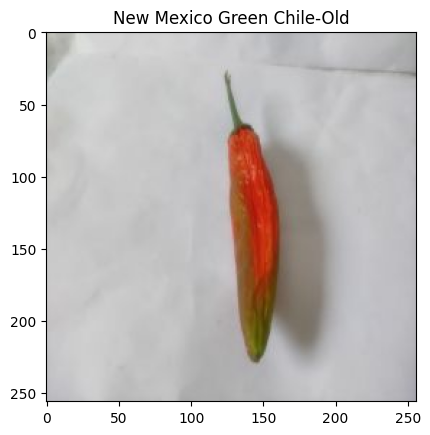

In [5]:
# Printing an image
for image_batch, labels_batch in dataset.take(1):
    plt.imshow(image_batch[0].numpy().astype("uint8"))
    plt.title(class_names[labels_batch[0]])

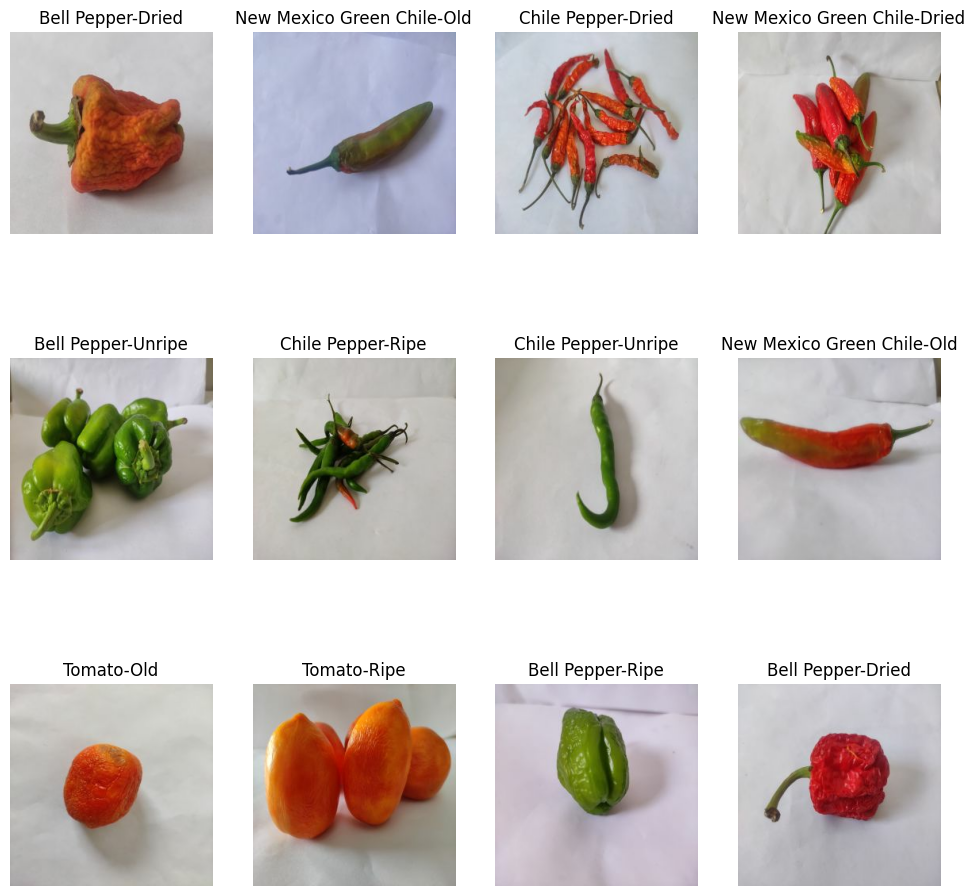

In [6]:
plt.figure(figsize=(12, 12))
for image_batch, labels_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

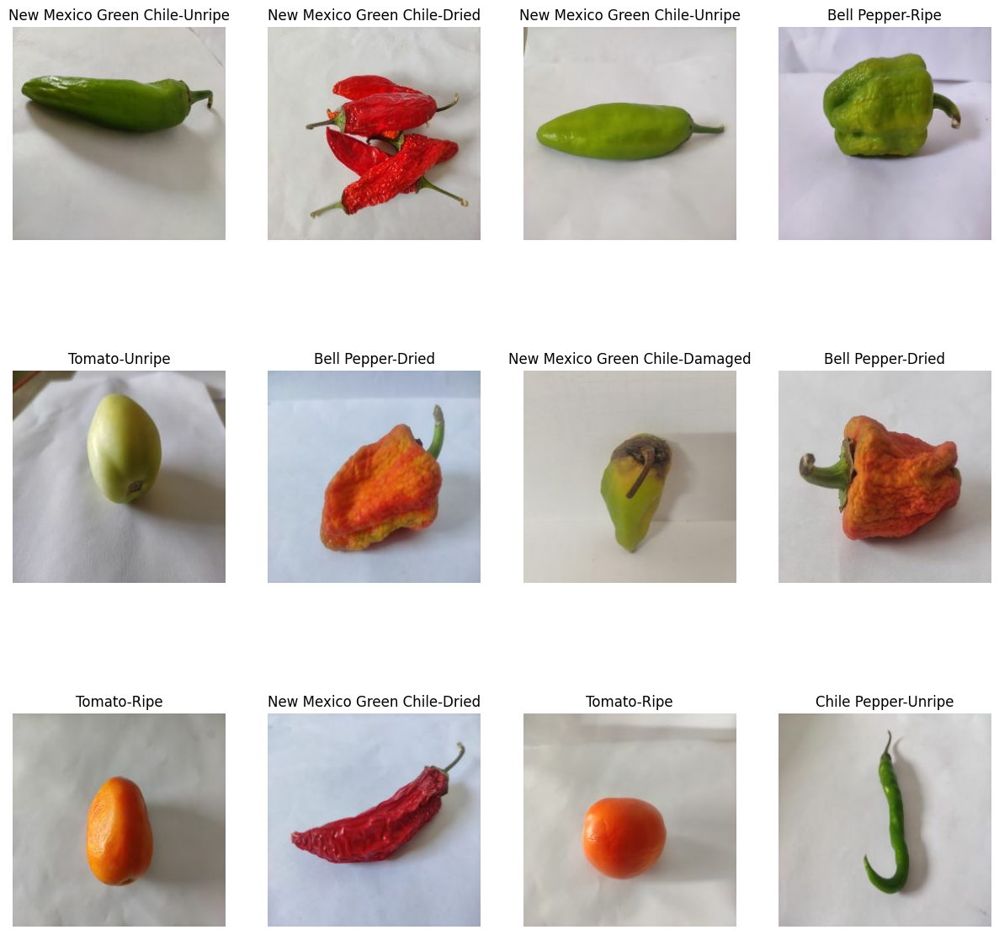

In [7]:
plt.figure(figsize=(15, 15))
for image_batch, labels_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

In [8]:
def get_dataset_partitions_tf(dataset, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    """
    Takes a dataset and splits it into train, validation and test sets. 
    """
    dataset_size = len(dataset)
    
    if shuffle:
        dataset = dataset.shuffle(shuffle_size, seed=85)
    
    train_size = int(train_split * dataset_size)
    val_size = int(val_split * dataset_size)
    
    train_set = dataset.take(train_size)    
    val_set = dataset.skip(train_size).take(val_size)
    test_set = dataset.skip(train_size).skip(val_size)
    
    return train_set, val_set, test_set

In [9]:
train_set, val_set, test_set = get_dataset_partitions_tf(dataset)

In [10]:
print("Configuring the dataset for better performance")
train_set = train_set.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_set = val_set.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_set = test_set.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

Configuring the dataset for better performance


In [11]:
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(256, 256),
  layers.experimental.preprocessing.Rescaling(1.0/255),
])

In [11]:
from keras.layers import Dropout

input_shape = (32, 256, 256, 3)
n_classes = 19

model1 = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32,(3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    Dropout(0.2),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(pool_size = (2, 2)),
    Dropout(0.2),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D(pool_size = (2, 2)),
    layers.Dropout(0.2),

    layers.Flatten(),

    layers.Dense(128, activation = 'relu'),
    layers.Dense(n_classes, activation = 'softmax'),
])

model1.build(input_shape=input_shape)

In [12]:
model1.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), 
               optimizer='adam',
               metrics =['accuracy'])

In [13]:
model1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (32, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (32, 127, 127, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (32, 127, 127, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (32, 62, 62, 64)         0         
 2D)                                                  

In [17]:
%%time
history1 = model1.fit(
    train_set,  
    batch_size = 32, 
    epochs = epochs, 
    verbose = 1, 
    validation_data = val_set)

Epoch 1/15
154/154 [==============================] - 141s 913ms/step - loss: 1.8166 - accuracy: 0.3856 - val_loss: 1.4334 - val_accuracy: 0.4901
Epoch 2/15
154/154 [==============================] - 141s 918ms/step - loss: 0.9717 - accuracy: 0.6603 - val_loss: 0.7805 - val_accuracy: 0.7401
Epoch 3/15
154/154 [==============================] - 136s 882ms/step - loss: 0.6656 - accuracy: 0.7625 - val_loss: 0.5333 - val_accuracy: 0.8306
Epoch 4/15
154/154 [==============================] - 136s 883ms/step - loss: 0.4770 - accuracy: 0.8321 - val_loss: 0.4225 - val_accuracy: 0.8783
Epoch 5/15
154/154 [==============================] - 135s 878ms/step - loss: 0.3694 - accuracy: 0.8707 - val_loss: 0.3668 - val_accuracy: 0.8931
Epoch 6/15
154/154 [==============================] - 139s 901ms/step - loss: 0.2474 - accuracy: 0.9151 - val_loss: 0.2428 - val_accuracy: 0.9342
Epoch 7/15
154/154 [==============================] - 137s 892ms/step - loss: 0.2186 - accuracy: 0.9219 - val_loss: 0.2839 -

In [18]:
model1.save('models/model1CNN.hdf5')

In [19]:
# Evaluate model performance on test set
scores = model1.evaluate(test_set)

20/20 [==============================] - 8s 198ms/step - loss: 0.1152 - accuracy: 0.9703


In [25]:
model1.evaluate(val_set)

19/19 [==============================] - 4s 201ms/step - loss: 0.1553 - accuracy: 0.9720


[0.15528418123722076, 0.9720394611358643]

In [26]:
model1.evaluate(train_set)

154/154 [==============================] - 31s 204ms/step - loss: 0.0329 - accuracy: 0.9957


[0.032850947231054306, 0.9957160353660583]

In [20]:
acc = history1.history['accuracy']
val_acc = history1.history['val_accuracy']

loss = history1.history['loss']
val_loss = history1.history['val_loss']

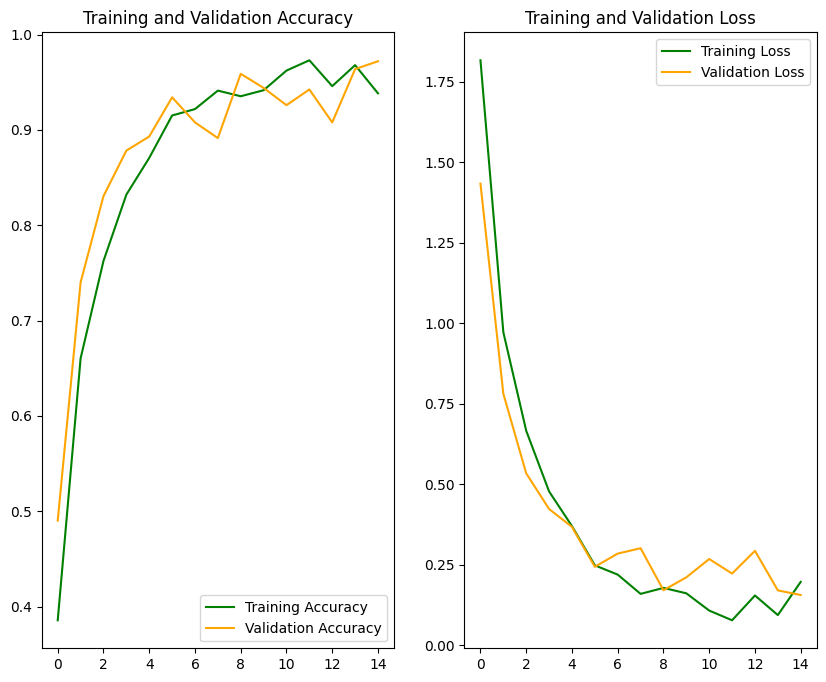

In [21]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(range(15), acc, color='green', label='Training Accuracy')
plt.plot(range(15), val_acc, color='orange', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(15), loss, color='green', label='Training Loss')
plt.plot(range(15), val_loss,color='orange', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [34]:
# Function that takes an image as an input
# And gives us the confidence score of the prediction

def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 57ms/step


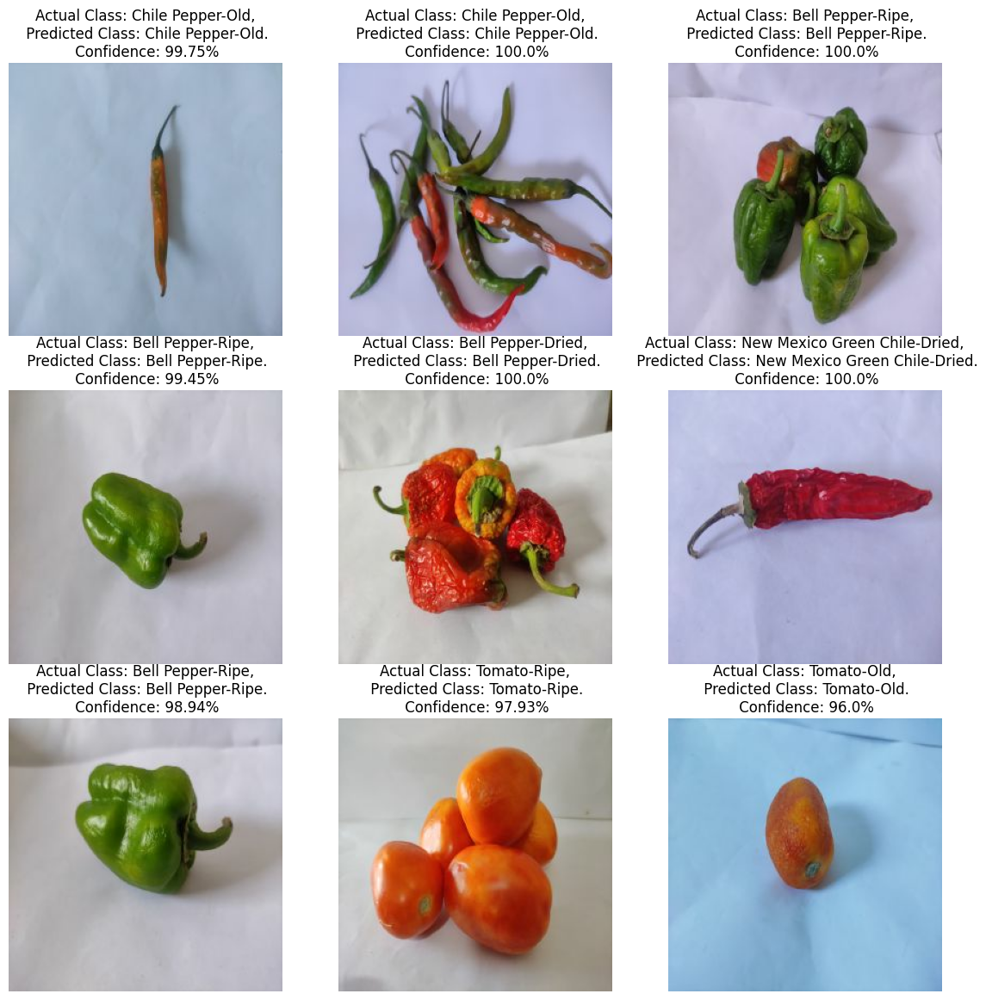

In [24]:
# Let's predict the first 9 images in the first batch
class_names = class_names

plt.figure(figsize=(14, 14))
for images, labels in test_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model1, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual Class: {actual_class},\n Predicted Class: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")
        

1/1 [==============================] - 0s 291ms/step
                                precision    recall  f1-score   support

           Bell Pepper-Damaged       1.00      1.00      1.00         4
             Bell Pepper-Dried       1.00      1.00      1.00        31
               Bell Pepper-Old       1.00      0.95      0.97        38
              Bell Pepper-Ripe       0.92      1.00      0.96        44
            Bell Pepper-Unripe       1.00      1.00      1.00         6
          Chile Pepper-Damaged       1.00      1.00      1.00        11
            Chile Pepper-Dried       0.95      0.97      0.96        59
              Chile Pepper-Old       0.94      0.94      0.94        18
             Chile Pepper-Ripe       1.00      1.00      1.00        18
           Chile Pepper-Unripe       0.94      1.00      0.97        17
New Mexico Green Chile-Damaged       1.00      1.00      1.00        12
  New Mexico Green Chile-Dried       0.95      0.97      0.96        59
    New Me

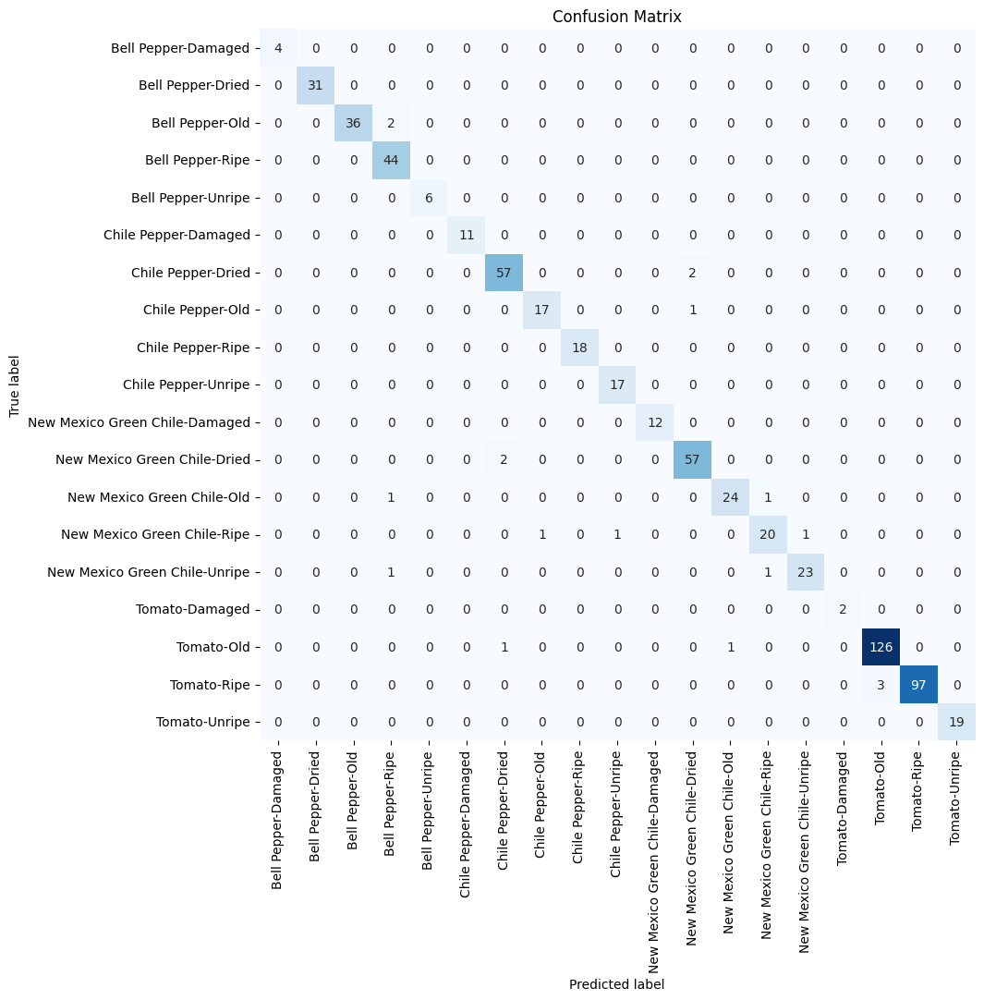

In [28]:
# Make predictions on the test set
y_pred = []
y_true = []
for images, labels in test_set:
    predictions = model1.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    y_pred.extend(predicted_labels)
    y_true.extend(labels.numpy())

# Create the confusion matrix
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xticks(np.arange(len(class_names))+0.5, class_names, rotation=90)
plt.yticks(np.arange(len(class_names))+0.5, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

# Calculate precision, recall, and f1-score for each class
from sklearn.metrics import classification_report
class_report = classification_report(y_true, y_pred, target_names=class_names)
print(class_report)

## VGG16

In [32]:
vgg_model2 = models.Sequential()

pretrained_model = tf.keras.applications.VGG16(
    include_top = False,
    input_shape = (256, 256, 3),
    classes = 19,
    weights = 'imagenet'
)

for layer in pretrained_model.layers:
    layer.trainable = False

vgg_model2.add(pretrained_model)
vgg_model2.add(layers.Flatten())
vgg_model2.add(layers.Dense(128, activation = 'relu'))
vgg_model2.add(layers.Dense(19, activation = 'softmax'))

In [33]:
vgg_model2.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 8, 8, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 32768)             0         
                                                                 
 dense_2 (Dense)             (None, 128)               4194432   
                                                                 
 dense_3 (Dense)             (None, 19)                2451      
                                                                 
Total params: 18,911,571
Trainable params: 4,196,883
Non-trainable params: 14,714,688
_________________________________________________________________


In [34]:
vgg_model2.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [35]:
%%time
history2 = vgg_model2.fit(
    train_set,
    epochs=epochs,
    batch_size=32,
    verbose=1,
    validation_data=val_set
)

Epoch 1/15
154/154 [==============================] - 498s 3s/step - loss: 3.1880 - accuracy: 0.6475 - val_loss: 0.5177 - val_accuracy: 0.8668
Epoch 2/15
154/154 [==============================] - 514s 3s/step - loss: 0.3958 - accuracy: 0.9023 - val_loss: 0.2025 - val_accuracy: 0.9391
Epoch 3/15
154/154 [==============================] - 505s 3s/step - loss: 0.2151 - accuracy: 0.9492 - val_loss: 0.1691 - val_accuracy: 0.9572
Epoch 4/15
154/154 [==============================] - 483s 3s/step - loss: 0.1450 - accuracy: 0.9639 - val_loss: 0.1107 - val_accuracy: 0.9770
Epoch 5/15
154/154 [==============================] - 498s 3s/step - loss: 0.1004 - accuracy: 0.9800 - val_loss: 0.1165 - val_accuracy: 0.9770
Epoch 6/15
154/154 [==============================] - 486s 3s/step - loss: 0.0746 - accuracy: 0.9841 - val_loss: 0.1059 - val_accuracy: 0.9803
Epoch 7/15
154/154 [==============================] - 485s 3s/step - loss: 0.0519 - accuracy: 0.9871 - val_loss: 0.1590 - val_accuracy: 0.9753

In [38]:
vgg_model2.save('models/model1VGG16.hdf5')

In [40]:
# Evaluate model performance on test set
scores = vgg_model2.evaluate(test_set)

20/20 [==============================] - 63s 3s/step - loss: 0.1014 - accuracy: 0.9812


In [41]:
vgg_model2.evaluate(train_set)

154/154 [==============================] - 503s 3s/step - loss: 0.0099 - accuracy: 0.9971


[0.009927704930305481, 0.9971440434455872]

In [42]:
vgg_model2.evaluate(val_set)

19/19 [==============================] - 58s 3s/step - loss: 0.1086 - accuracy: 0.9803


[0.10857292264699936, 0.9802631735801697]

In [44]:
acc = history2.history['accuracy']
val_acc = history2.history['val_accuracy']

loss = history2.history['loss']
val_loss = history2.history['val_loss']

1/1 [==============================] - 0s 167ms/step


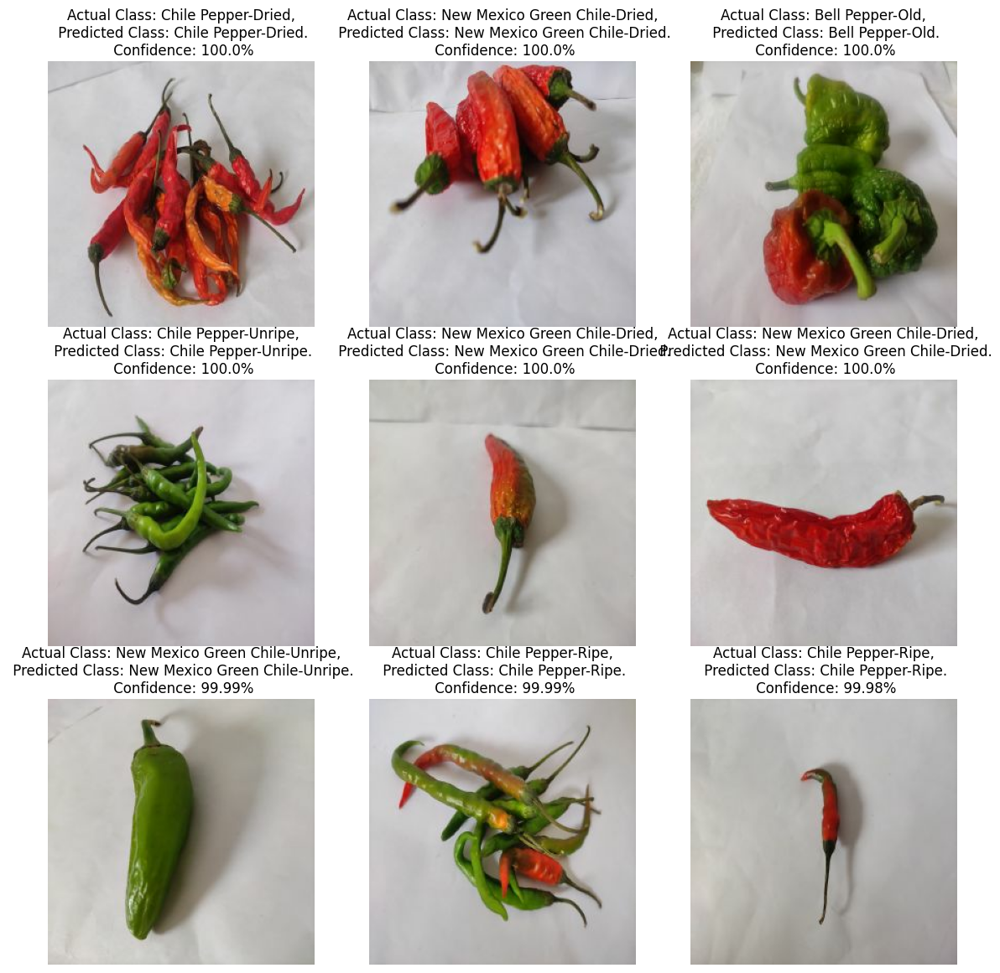

In [45]:
# Let's predict the first 9 images in the first batch
class_names = class_names

plt.figure(figsize=(14, 14))
for images, labels in test_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(vgg_model2, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual Class: {actual_class},\n Predicted Class: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")
        

1/1 [==============================] - 3s 3s/step
                                precision    recall  f1-score   support

           Bell Pepper-Damaged       1.00      1.00      1.00         4
             Bell Pepper-Dried       1.00      1.00      1.00        31
               Bell Pepper-Old       1.00      0.97      0.99        38
              Bell Pepper-Ripe       0.98      1.00      0.99        44
            Bell Pepper-Unripe       1.00      1.00      1.00         6
          Chile Pepper-Damaged       1.00      1.00      1.00        11
            Chile Pepper-Dried       0.98      0.98      0.98        59
              Chile Pepper-Old       0.94      0.94      0.94        18
             Chile Pepper-Ripe       1.00      0.94      0.97        18
           Chile Pepper-Unripe       1.00      1.00      1.00        17
New Mexico Green Chile-Damaged       1.00      1.00      1.00        12
  New Mexico Green Chile-Dried       0.98      0.98      0.98        59
    New Mexic

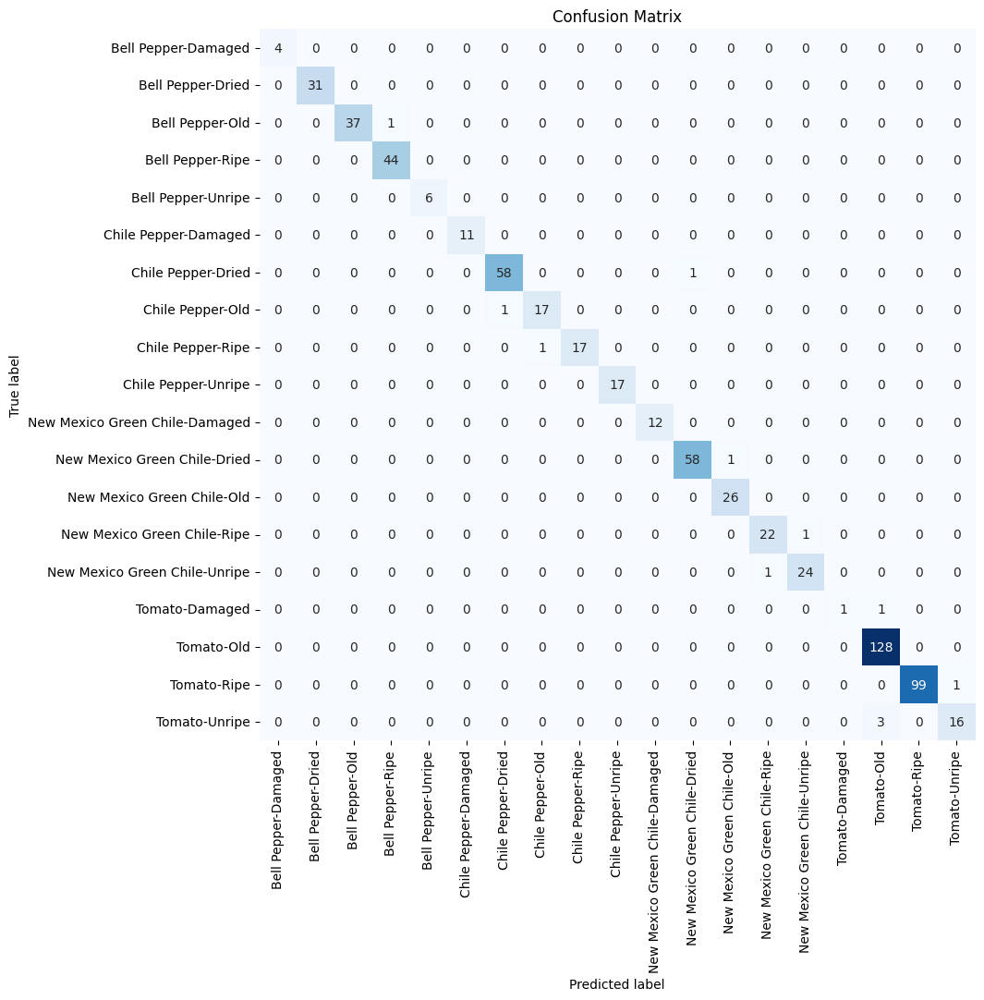

In [46]:
# Make predictions on the test set
y_pred = []
y_true = []
for images, labels in test_set:
    predictions = vgg_model2.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    y_pred.extend(predicted_labels)
    y_true.extend(labels.numpy())

# Create the confusion matrix
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xticks(np.arange(len(class_names))+0.5, class_names, rotation=90)
plt.yticks(np.arange(len(class_names))+0.5, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

# Calculate precision, recall, and f1-score for each class
from sklearn.metrics import classification_report
class_report = classification_report(y_true, y_pred, target_names=class_names)
print(class_report)

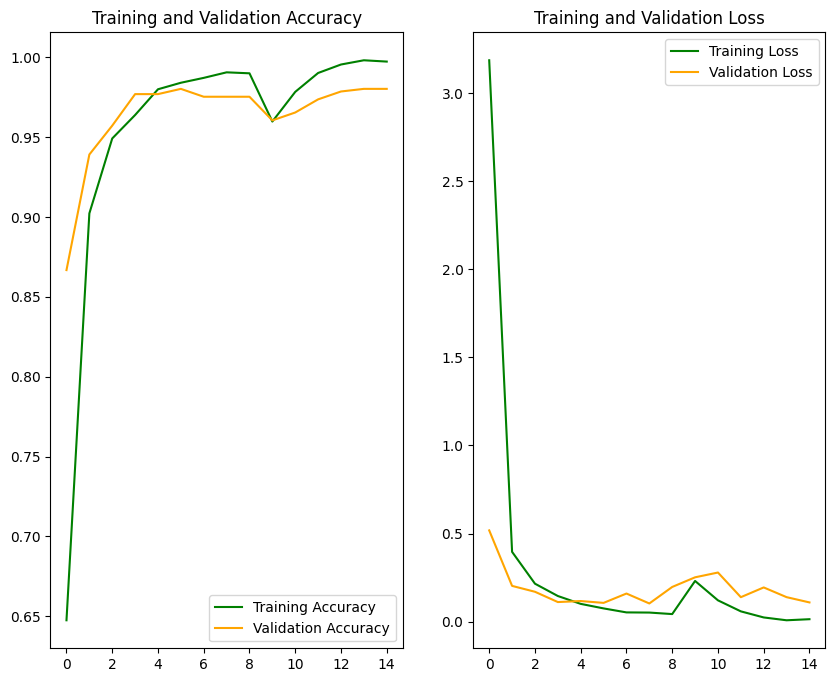

In [47]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(range(15), acc, color='green', label='Training Accuracy')
plt.plot(range(15), val_acc, color='orange', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(15), loss, color='green', label='Training Loss')
plt.plot(range(15), val_loss,color='orange', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## ResNet50V2

In [12]:
model3 = models.Sequential()

pretrained_model = tf.keras.applications.ResNet50V2(
    include_top = False,
    input_shape = (256, 256, 3),
    classes = 19,
    weights = 'imagenet'
)

for layer in pretrained_model.layers:
    layer.trainable = False

model3.add(pretrained_model)
model3.add(layers.Flatten())
model3.add(layers.Dense(128, activation = 'relu'))
model3.add(layers.Dense(19, activation = 'softmax'))

In [13]:
model3.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 8, 8, 2048)        23564800  
                                                                 
 flatten (Flatten)           (None, 131072)            0         
                                                                 
 dense (Dense)               (None, 128)               16777344  
                                                                 
 dense_1 (Dense)             (None, 19)                2451      
                                                                 
Total params: 40,344,595
Trainable params: 16,779,795
Non-trainable params: 23,564,800
_________________________________________________________________


In [14]:
model3.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
%%time
history3 = model3.fit(
    train_set,
    epochs=epochs,
    batch_size=32,
    verbose=1,
    validation_data=val_set
)

In [53]:
model3.save('models/model3.hdf5')

In [54]:
# Evaluate model performance on test set
score3 = model3.evaluate(test_set)

20/20 [==============================] - 35s 2s/step - loss: 2.5836 - accuracy: 0.2000


In [55]:
model3.evaluate(val_set)

19/19 [==============================] - 31s 2s/step - loss: 2.5959 - accuracy: 0.2171


[2.595932722091675, 0.21710526943206787]

In [56]:
model3.evaluate(train_set)

154/154 [==============================] - 255s 2s/step - loss: 2.5914 - accuracy: 0.1995


[2.591355085372925, 0.19951041042804718]

In [57]:
acc = history3.history['accuracy']
val_acc = history3.history['val_accuracy']

loss = history3.history['loss']
val_loss = history3.history['val_loss']

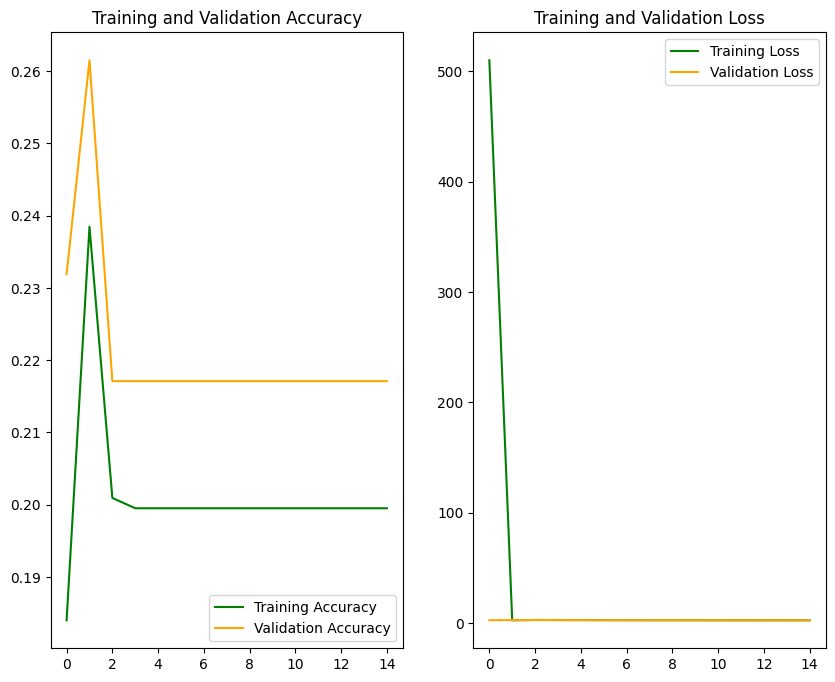

In [58]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(range(15), acc, color='green', label='Training Accuracy')
plt.plot(range(15), val_acc, color='orange', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(15), loss, color='green', label='Training Loss')
plt.plot(range(15), val_loss,color='orange', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

1/1 [==============================] - 0s 202ms/step


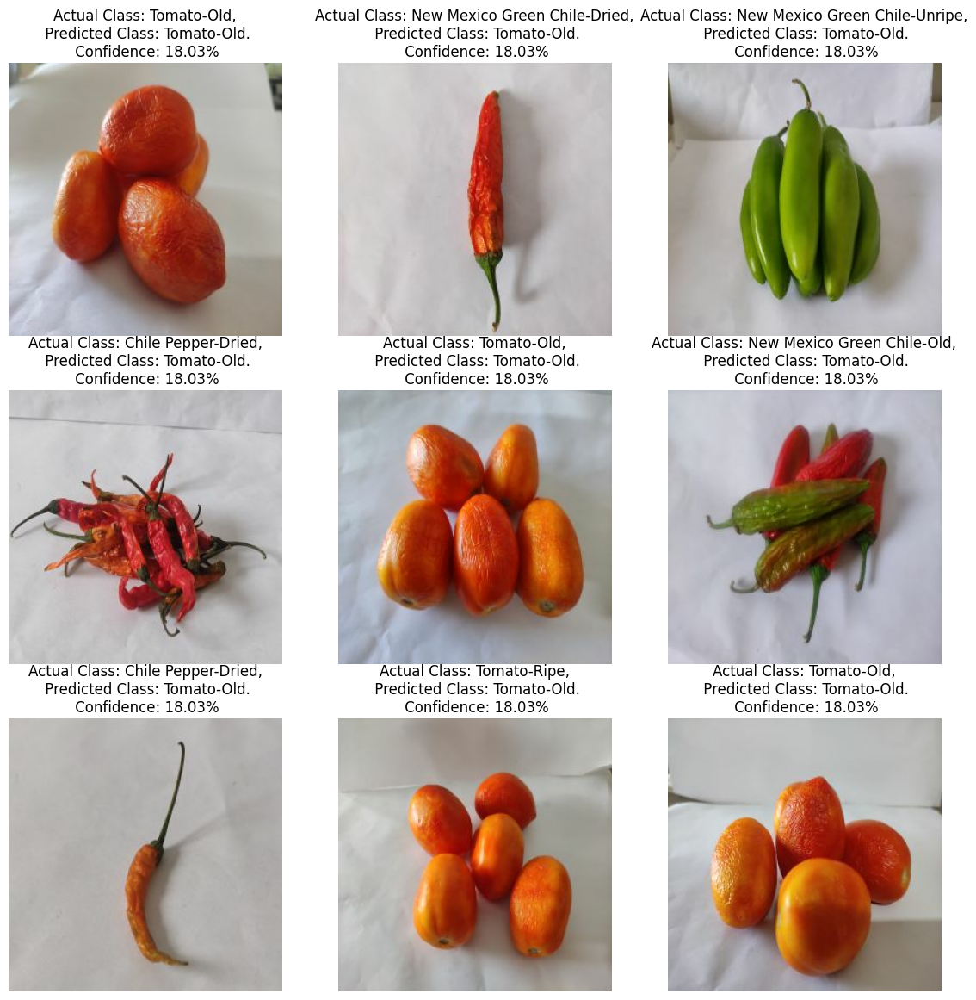

In [59]:
# Let's predict the first 9 images in the first batch
class_names = class_names

plt.figure(figsize=(14, 14))
for images, labels in test_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model3, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual Class: {actual_class},\n Predicted Class: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")
        

1/1 [==============================] - 2s 2s/step
                                precision    recall  f1-score   support

           Bell Pepper-Damaged       0.00      0.00      0.00         4
             Bell Pepper-Dried       0.00      0.00      0.00        31
               Bell Pepper-Old       0.00      0.00      0.00        38
              Bell Pepper-Ripe       0.00      0.00      0.00        44
            Bell Pepper-Unripe       0.00      0.00      0.00         6
          Chile Pepper-Damaged       0.00      0.00      0.00        11
            Chile Pepper-Dried       0.00      0.00      0.00        59
              Chile Pepper-Old       0.00      0.00      0.00        18
             Chile Pepper-Ripe       0.00      0.00      0.00        18
           Chile Pepper-Unripe       0.00      0.00      0.00        17
New Mexico Green Chile-Damaged       0.00      0.00      0.00        12
  New Mexico Green Chile-Dried       0.00      0.00      0.00        59
    New Mexic

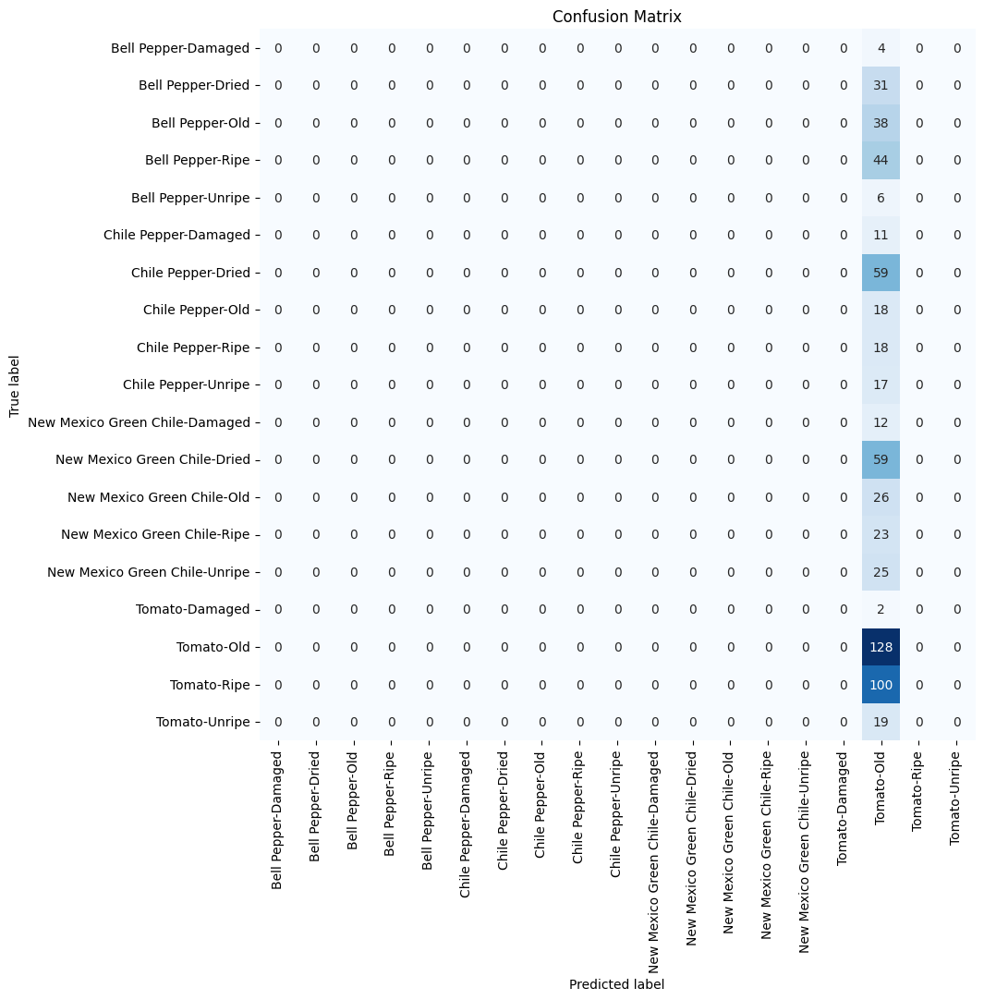

In [60]:
# Make predictions on the test set
y_pred = []
y_true = []
for images, labels in test_set:
    predictions = model3.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    y_pred.extend(predicted_labels)
    y_true.extend(labels.numpy())

# Create the confusion matrix
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xticks(np.arange(len(class_names))+0.5, class_names, rotation=90)
plt.yticks(np.arange(len(class_names))+0.5, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

# Calculate precision, recall, and f1-score for each class
from sklearn.metrics import classification_report
class_report = classification_report(y_true, y_pred, target_names=class_names)
print(class_report)

## ResNet50

In [19]:
model4 = models.Sequential()

pretrained_model = tf.keras.applications.ResNet50(
    include_top = False,
    input_shape = (256, 256, 3),
    classes = 19,
    weights = 'imagenet'
)

for layer in pretrained_model.layers:
    layer.trainable = False

model4.add(pretrained_model)
model4.add(layers.Flatten())
model4.add(layers.Dense(128, activation = 'relu'))
model4.add(layers.Dense(19, activation = 'softmax'))

In [20]:
model4.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [21]:
%%time
history4 = model4.fit(
    train_set,
    epochs=epochs,
    batch_size=32,
    verbose=1,
    validation_data=val_set
)

Epoch 1/15
154/154 [==============================] - 347s 2s/step - loss: 2.5652 - accuracy: 0.6665 - val_loss: 0.5422 - val_accuracy: 0.8372
Epoch 2/15
154/154 [==============================] - 338s 2s/step - loss: 0.3776 - accuracy: 0.8794 - val_loss: 0.3199 - val_accuracy: 0.9128
Epoch 3/15
154/154 [==============================] - 316s 2s/step - loss: 0.2551 - accuracy: 0.9255 - val_loss: 0.2264 - val_accuracy: 0.9359
Epoch 4/15
154/154 [==============================] - 289s 2s/step - loss: 0.1536 - accuracy: 0.9502 - val_loss: 0.1599 - val_accuracy: 0.9589
Epoch 5/15
154/154 [==============================] - 285s 2s/step - loss: 0.1024 - accuracy: 0.9706 - val_loss: 0.2436 - val_accuracy: 0.9490
Epoch 6/15
154/154 [==============================] - 281s 2s/step - loss: 0.1109 - accuracy: 0.9696 - val_loss: 0.1815 - val_accuracy: 0.9572
Epoch 7/15
154/154 [==============================] - 279s 2s/step - loss: 0.1096 - accuracy: 0.9710 - val_loss: 0.2403 - val_accuracy: 0.9424

In [22]:
model4.save('models/model4.hdf5')

In [23]:
# Evaluate model performance on test set
score4 = model4.evaluate(test_set)

20/20 [==============================] - 111s 2s/step - loss: 0.1216 - accuracy: 0.9766


In [24]:
model4.evaluate(val_set)

19/19 [==============================] - 30s 2s/step - loss: 0.3398 - accuracy: 0.9622


[0.3397808372974396, 0.9621710777282715]

In [25]:
model4.evaluate(train_set)

154/154 [==============================] - 242s 2s/step - loss: 0.0808 - accuracy: 0.9845


[0.08079613745212555, 0.9844961166381836]

In [26]:
acc = history4.history['accuracy']
val_acc = history4.history['val_accuracy']

loss = history4.history['loss']
val_loss = history4.history['val_loss']

In [28]:
# Function that takes an image as an input
# And gives us the confidence score of the prediction

def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 145ms/step


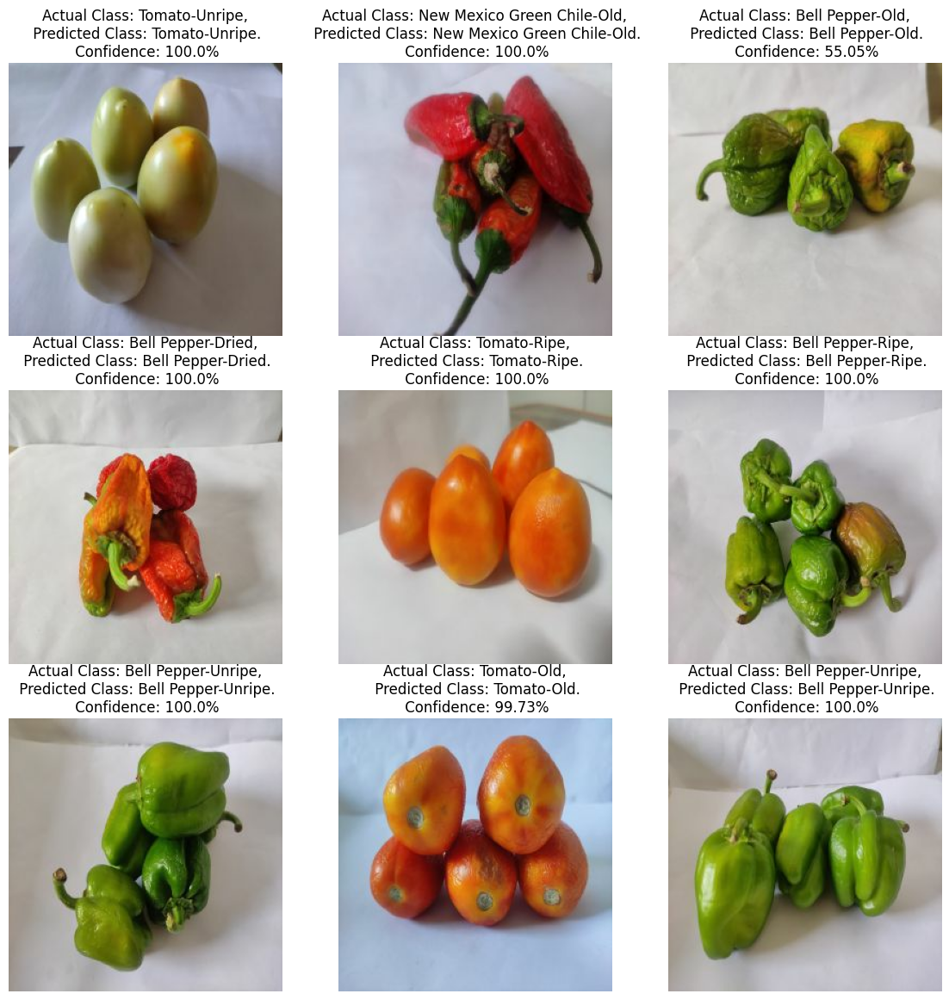

In [29]:
# Let's predict the first 9 images in the first batch
class_names = class_names

plt.figure(figsize=(14, 14))
for images, labels in test_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model4, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual Class: {actual_class},\n Predicted Class: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

1/1 [==============================] - 1s 1s/step
                                precision    recall  f1-score   support

           Bell Pepper-Damaged       1.00      0.75      0.86         4
             Bell Pepper-Dried       0.94      1.00      0.97        31
               Bell Pepper-Old       1.00      0.84      0.91        38
              Bell Pepper-Ripe       0.90      1.00      0.95        44
            Bell Pepper-Unripe       1.00      1.00      1.00         6
          Chile Pepper-Damaged       1.00      1.00      1.00        11
            Chile Pepper-Dried       0.98      0.98      0.98        59
              Chile Pepper-Old       1.00      1.00      1.00        18
             Chile Pepper-Ripe       0.94      0.89      0.91        18
           Chile Pepper-Unripe       0.94      1.00      0.97        17
New Mexico Green Chile-Damaged       1.00      1.00      1.00        12
  New Mexico Green Chile-Dried       0.98      1.00      0.99        59
    New Mexic

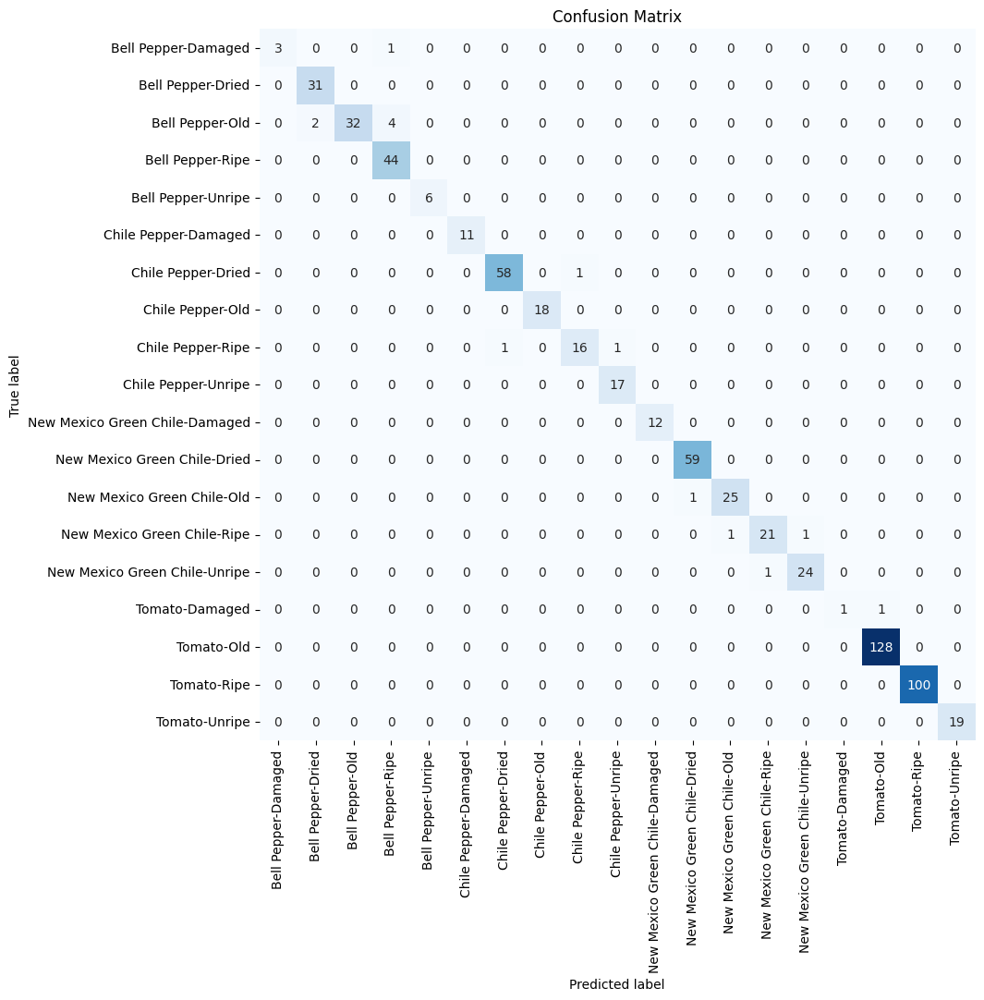

In [30]:
# Make predictions on the test set
y_pred = []
y_true = []
for images, labels in test_set:
    predictions = model4.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    y_pred.extend(predicted_labels)
    y_true.extend(labels.numpy())

# Create the confusion matrix
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xticks(np.arange(len(class_names))+0.5, class_names, rotation=90)
plt.yticks(np.arange(len(class_names))+0.5, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

# Calculate precision, recall, and f1-score for each class
from sklearn.metrics import classification_report
class_report = classification_report(y_true, y_pred, target_names=class_names)
print(class_report)

## InceptionV3

In [32]:
model5 = models.Sequential()

pretrained_model = tf.keras.applications.InceptionV3(
    include_top = False,
    input_shape = (256, 256, 3),
    classes = 19,
    weights = 'imagenet'
)

for layer in pretrained_model.layers:
    layer.trainable = False

model5.add(pretrained_model)
model5.add(layers.Flatten())
model5.add(layers.Dense(128, activation = 'relu'))
model5.add(layers.Dense(19, activation = 'softmax'))

In [33]:
model5.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 flatten_3 (Flatten)         (None, 73728)             0         
                                                                 
 dense_6 (Dense)             (None, 128)               9437312   
                                                                 
 dense_7 (Dense)             (None, 19)                2451      
                                                                 
Total params: 31,242,547
Trainable params: 9,439,763
Non-trainable params: 21,802,784
_________________________________________________________________


In [34]:
model5.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [35]:
%%time
history5 = model5.fit(
    train_set,
    epochs=epochs,
    batch_size=32,
    verbose=1,
    validation_data=val_set
)

Epoch 1/15
154/154 [==============================] - 196s 1s/step - loss: 77.6124 - accuracy: 0.1644 - val_loss: 2.9065 - val_accuracy: 0.1201
Epoch 2/15
154/154 [==============================] - 208s 1s/step - loss: 2.8749 - accuracy: 0.1826 - val_loss: 2.8199 - val_accuracy: 0.2039
Epoch 3/15
154/154 [==============================] - 206s 1s/step - loss: 2.7106 - accuracy: 0.1946 - val_loss: 2.7768 - val_accuracy: 0.2105
Epoch 4/15
154/154 [==============================] - 209s 1s/step - loss: 2.7586 - accuracy: 0.1975 - val_loss: 2.7594 - val_accuracy: 0.2171
Epoch 5/15
154/154 [==============================] - 206s 1s/step - loss: 2.7388 - accuracy: 0.1975 - val_loss: 2.7232 - val_accuracy: 0.2171
Epoch 6/15
154/154 [==============================] - 205s 1s/step - loss: 2.7048 - accuracy: 0.1995 - val_loss: 2.6914 - val_accuracy: 0.2171
Epoch 7/15
154/154 [==============================] - 207s 1s/step - loss: 2.6763 - accuracy: 0.1995 - val_loss: 2.6669 - val_accuracy: 0.217

In [36]:
model5.save('models/model5.hdf5')

In [37]:
# Evaluate model performance on test set
score5 = model5.evaluate(test_set)

20/20 [==============================] - 23s 1s/step - loss: 2.5823 - accuracy: 0.2000


In [38]:
model5.evaluate(train_set)

154/154 [==============================] - 169s 1s/step - loss: 2.5905 - accuracy: 0.1995


[2.590505361557007, 0.19951041042804718]

In [39]:
model5.evaluate(val_set)

19/19 [==============================] - 20s 1s/step - loss: 2.5957 - accuracy: 0.2171


[2.595736265182495, 0.21710526943206787]

In [40]:
acc = history5.history['accuracy']
val_acc = history5.history['val_accuracy']

loss = history5.history['loss']
val_loss = history5.history['val_loss']

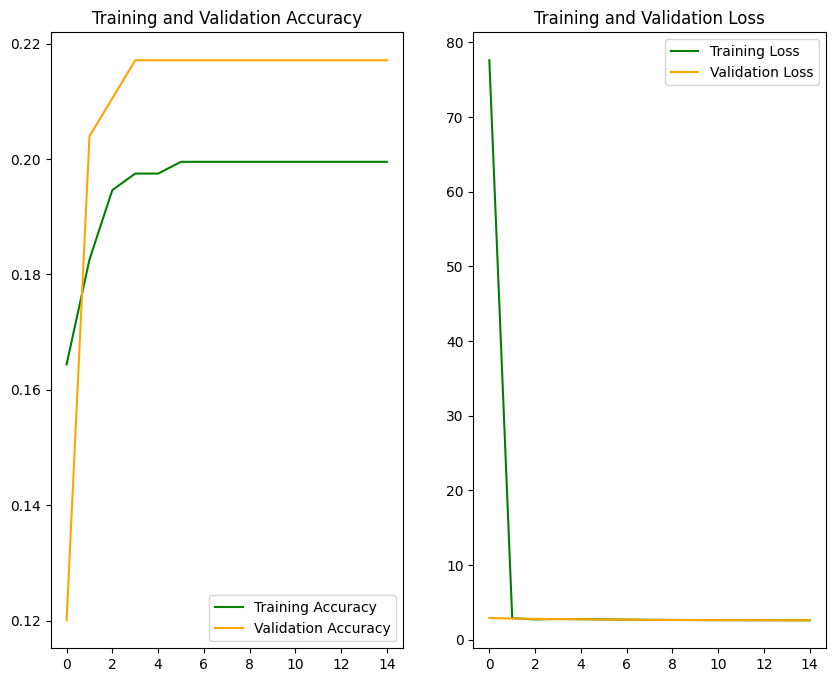

In [41]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(range(15), acc, color='green', label='Training Accuracy')
plt.plot(range(15), val_acc, color='orange', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(15), loss, color='green', label='Training Loss')
plt.plot(range(15), val_loss,color='orange', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

1/1 [==============================] - 0s 120ms/step


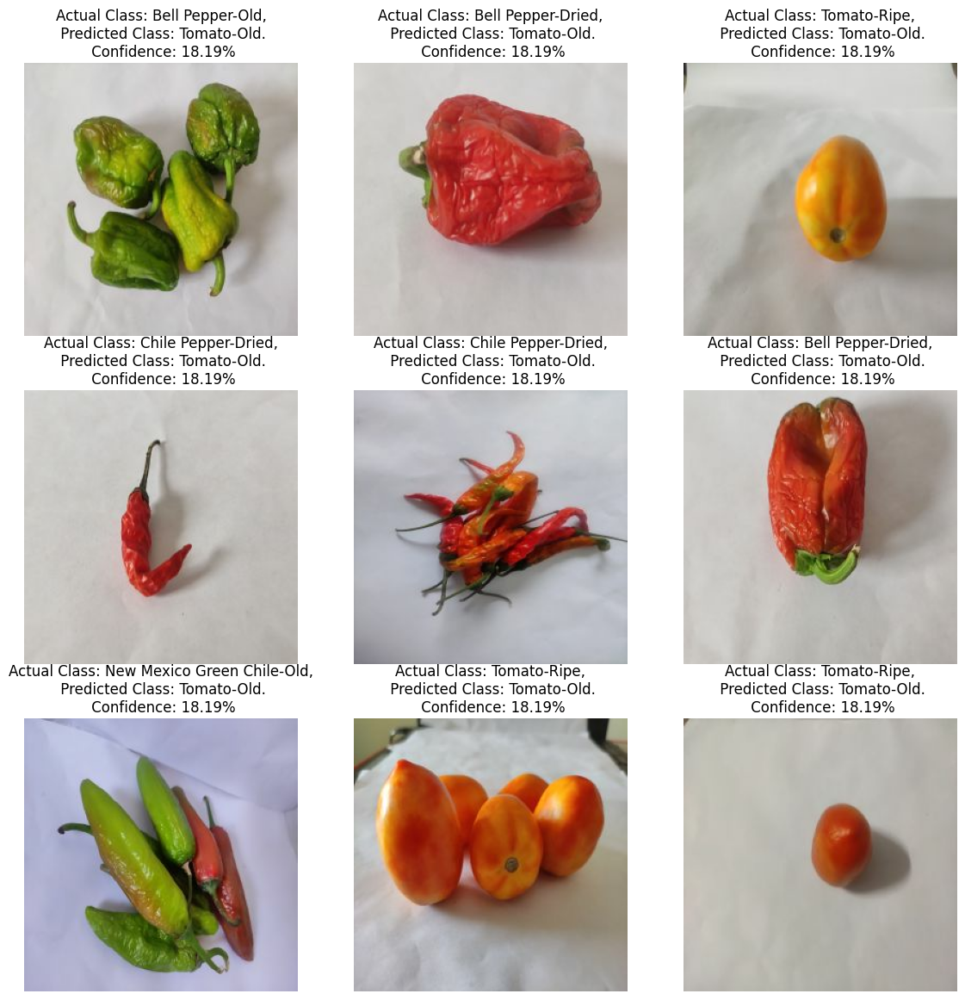

In [42]:
# Let's predict the first 9 images in the first batch
class_names = class_names

plt.figure(figsize=(14, 14))
for images, labels in test_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model5, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual Class: {actual_class},\n Predicted Class: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

1/1 [==============================] - 1s 853ms/step
                                precision    recall  f1-score   support

           Bell Pepper-Damaged       0.00      0.00      0.00         4
             Bell Pepper-Dried       0.00      0.00      0.00        31
               Bell Pepper-Old       0.00      0.00      0.00        38
              Bell Pepper-Ripe       0.00      0.00      0.00        44
            Bell Pepper-Unripe       0.00      0.00      0.00         6
          Chile Pepper-Damaged       0.00      0.00      0.00        11
            Chile Pepper-Dried       0.00      0.00      0.00        59
              Chile Pepper-Old       0.00      0.00      0.00        18
             Chile Pepper-Ripe       0.00      0.00      0.00        18
           Chile Pepper-Unripe       0.00      0.00      0.00        17
New Mexico Green Chile-Damaged       0.00      0.00      0.00        12
  New Mexico Green Chile-Dried       0.00      0.00      0.00        59
    New Me

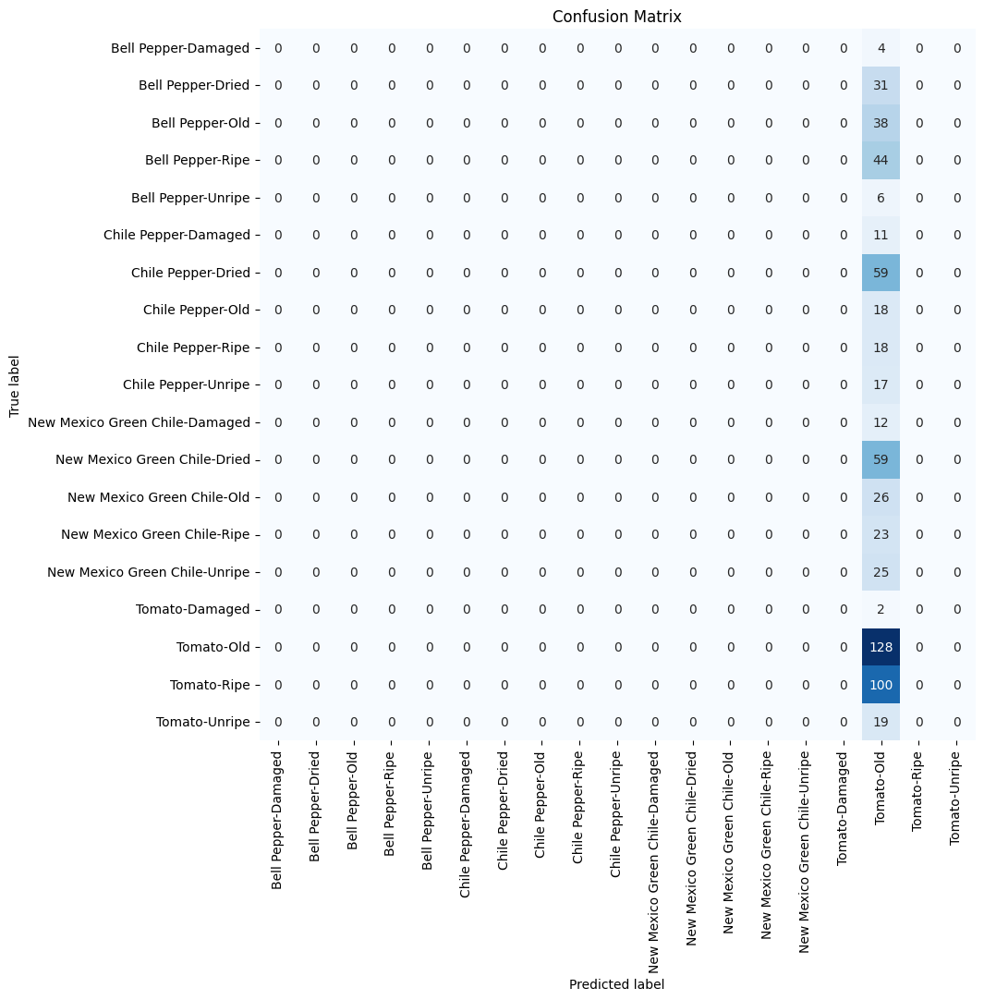

In [43]:
# Make predictions on the test set
y_pred = []
y_true = []
for images, labels in test_set:
    predictions = model5.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    y_pred.extend(predicted_labels)
    y_true.extend(labels.numpy())

# Create the confusion matrix
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xticks(np.arange(len(class_names))+0.5, class_names, rotation=90)
plt.yticks(np.arange(len(class_names))+0.5, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

# Calculate precision, recall, and f1-score for each class
from sklearn.metrics import classification_report
class_report = classification_report(y_true, y_pred, target_names=class_names)
print(class_report)

## ResNet152

In [12]:
model6 = models.Sequential()

pretrained_model = tf.keras.applications.ResNet152(
    include_top = False,
    input_shape = (256, 256, 3),
    classes = 19,
    weights = 'imagenet'
)

for layer in pretrained_model.layers:
    layer.trainable = False

model6.add(pretrained_model)
model6.add(layers.Flatten())
model6.add(layers.Dense(128, activation = 'relu'))
model6.add(layers.Dense(19, activation = 'softmax'))

In [13]:
model6.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet152 (Functional)      (None, 8, 8, 2048)        58370944  
                                                                 
 flatten (Flatten)           (None, 131072)            0         
                                                                 
 dense (Dense)               (None, 128)               16777344  
                                                                 
 dense_1 (Dense)             (None, 19)                2451      
                                                                 
Total params: 75,150,739
Trainable params: 16,779,795
Non-trainable params: 58,370,944
_________________________________________________________________


In [14]:
model6.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [15]:
%%time
history6 = model6.fit(
    train_set,
    epochs=epochs,
    batch_size=32,
    verbose=1,
    validation_data=val_set
)

Epoch 1/15
154/154 [==============================] - 683s 4s/step - loss: 3.7716 - accuracy: 0.7636 - val_loss: 0.2252 - val_accuracy: 0.9375
Epoch 2/15
154/154 [==============================] - 762s 5s/step - loss: 0.1897 - accuracy: 0.9523 - val_loss: 0.2102 - val_accuracy: 0.9474
Epoch 3/15
154/154 [==============================] - 709s 5s/step - loss: 0.1163 - accuracy: 0.9723 - val_loss: 0.2368 - val_accuracy: 0.9539
Epoch 4/15
154/154 [==============================] - 694s 5s/step - loss: 0.1718 - accuracy: 0.9655 - val_loss: 0.3459 - val_accuracy: 0.9424
Epoch 5/15
154/154 [==============================] - 682s 4s/step - loss: 0.1416 - accuracy: 0.9700 - val_loss: 0.1836 - val_accuracy: 0.9671
Epoch 6/15
154/154 [==============================] - 695s 5s/step - loss: 0.0369 - accuracy: 0.9918 - val_loss: 0.1157 - val_accuracy: 0.9786
Epoch 7/15
154/154 [==============================] - 682s 4s/step - loss: 0.0707 - accuracy: 0.9857 - val_loss: 0.1613 - val_accuracy: 0.9737

In [16]:
model6.save('models/model6.hdf5')

In [17]:
# Evaluate model performance on test set
score6 = model6.evaluate(test_set)

20/20 [==============================] - 76s 3s/step - loss: 0.0769 - accuracy: 0.9875


In [18]:
model6.evaluate(val_set)

19/19 [==============================] - 61s 3s/step - loss: 0.1218 - accuracy: 0.9885


[0.12177016586065292, 0.9884868264198303]

In [19]:
model6.evaluate(train_set)

154/154 [==============================] - 481s 3s/step - loss: 0.0141 - accuracy: 0.9961


[0.014101550914347172, 0.9961240291595459]

In [20]:
acc = history6.history['accuracy']
val_acc = history6.history['val_accuracy']

loss = history6.history['loss']
val_loss = history6.history['val_loss']

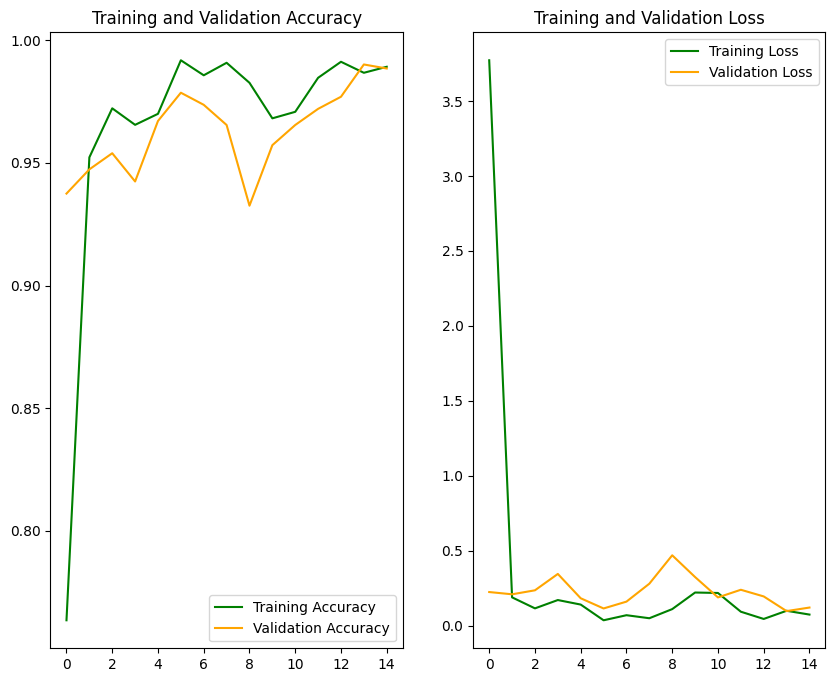

In [21]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(range(15), acc, color='green', label='Training Accuracy')
plt.plot(range(15), val_acc, color='orange', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(15), loss, color='green', label='Training Loss')
plt.plot(range(15), val_loss,color='orange', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

1/1 [==============================] - 3s 3s/step
                                precision    recall  f1-score   support

           Bell Pepper-Damaged       1.00      1.00      1.00         4
             Bell Pepper-Dried       1.00      1.00      1.00        31
               Bell Pepper-Old       0.97      0.97      0.97        38
              Bell Pepper-Ripe       0.98      0.98      0.98        44
            Bell Pepper-Unripe       1.00      1.00      1.00         6
          Chile Pepper-Damaged       1.00      1.00      1.00        11
            Chile Pepper-Dried       0.97      1.00      0.98        59
              Chile Pepper-Old       1.00      0.89      0.94        18
             Chile Pepper-Ripe       1.00      1.00      1.00        18
           Chile Pepper-Unripe       1.00      1.00      1.00        17
New Mexico Green Chile-Damaged       1.00      1.00      1.00        12
  New Mexico Green Chile-Dried       1.00      0.98      0.99        59
    New Mexic

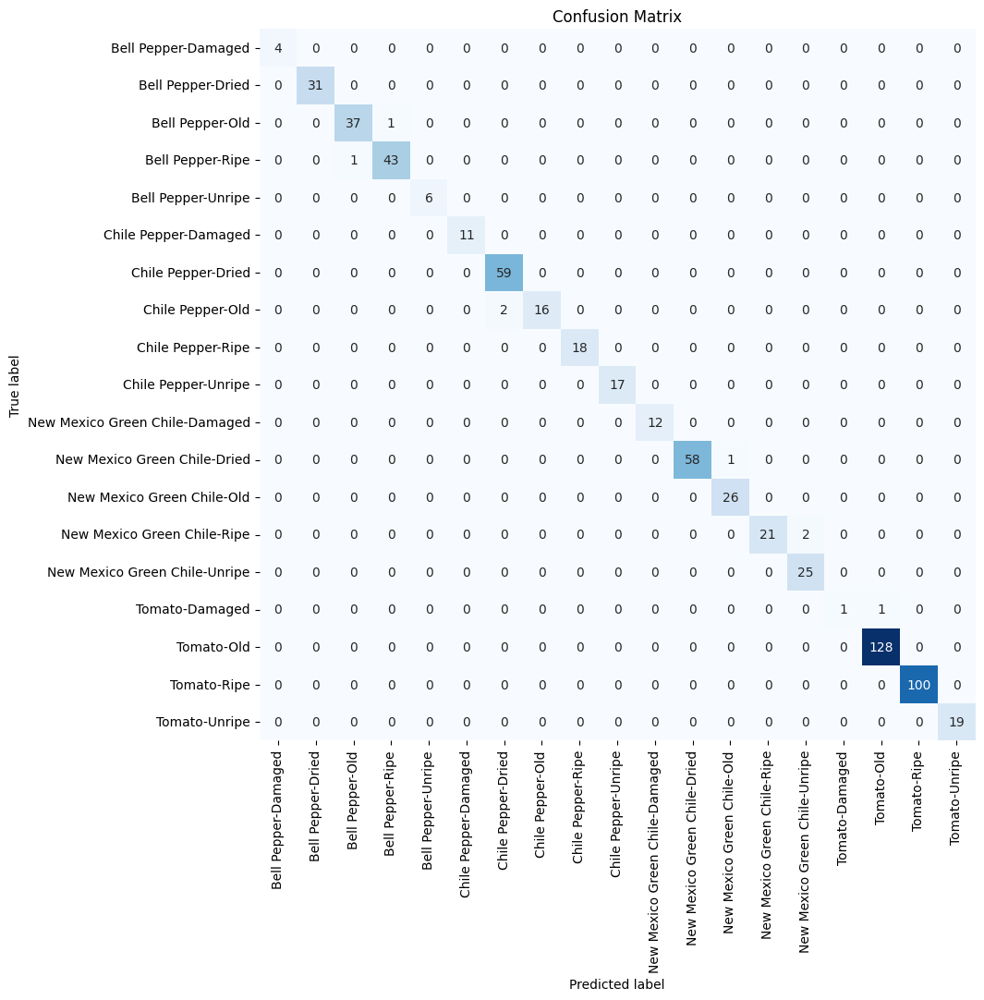

In [22]:
# Make predictions on the test set
y_pred = []
y_true = []
for images, labels in test_set:
    predictions = model6.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    y_pred.extend(predicted_labels)
    y_true.extend(labels.numpy())

# Create the confusion matrix
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xticks(np.arange(len(class_names))+0.5, class_names, rotation=90)
plt.yticks(np.arange(len(class_names))+0.5, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

# Calculate precision, recall, and f1-score for each class
from sklearn.metrics import classification_report
class_report = classification_report(y_true, y_pred, target_names=class_names)
print(class_report)

In [ ]:
# Let's predict the first 9 images in the first batch
class_names = class_names

plt.figure(figsize=(14, 14))
for images, labels in test_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model6, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual Class: {actual_class},\n Predicted Class: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

## MobileNetV2

In [23]:
model7 = models.Sequential()

pretrained_model = tf.keras.applications.MobileNetV2(
    include_top = False,
    input_shape = (256, 256, 3),
    classes = 19,
    weights = 'imagenet'
)

for layer in pretrained_model.layers:
    layer.trainable = False

model7.add(pretrained_model)
model7.add(layers.Flatten())
model7.add(layers.Dense(128, activation = 'relu'))
model7.add(layers.Dense(19, activation = 'softmax'))

9406464/9406464 [==============================] - 0s 0us/step


In [24]:
model7.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [25]:
%%time
history7 = model7.fit(
    train_set,
    epochs=epochs,
    batch_size=32,
    verbose=1,
    validation_data=val_set
)

Epoch 1/15
154/154 [==============================] - 81s 513ms/step - loss: 5.2731 - accuracy: 0.5208 - val_loss: 0.8476 - val_accuracy: 0.7303
Epoch 2/15
154/154 [==============================] - 78s 508ms/step - loss: 0.6678 - accuracy: 0.7968 - val_loss: 0.4954 - val_accuracy: 0.8635
Epoch 3/15
154/154 [==============================] - 80s 521ms/step - loss: 0.3157 - accuracy: 0.9125 - val_loss: 0.2963 - val_accuracy: 0.9128
Epoch 4/15
154/154 [==============================] - 80s 518ms/step - loss: 0.1605 - accuracy: 0.9523 - val_loss: 0.1972 - val_accuracy: 0.9408
Epoch 5/15
154/154 [==============================] - 79s 515ms/step - loss: 0.0838 - accuracy: 0.9800 - val_loss: 0.1179 - val_accuracy: 0.9671
Epoch 6/15
154/154 [==============================] - 79s 515ms/step - loss: 0.0330 - accuracy: 0.9922 - val_loss: 0.0960 - val_accuracy: 0.9671
Epoch 7/15
154/154 [==============================] - 80s 520ms/step - loss: 0.0130 - accuracy: 0.9984 - val_loss: 0.0797 - val_ac

In [27]:
model7.save('models/model7.hdf5')

In [28]:
# Evaluate model performance on test set
score7 = model7.evaluate(test_set)

20/20 [==============================] - 9s 430ms/step - loss: 0.0558 - accuracy: 0.9844


In [29]:
model7.evaluate(val_set)

19/19 [==============================] - 8s 428ms/step - loss: 0.0671 - accuracy: 0.9786


[0.06712134927511215, 0.9786184430122375]

In [30]:
model7.evaluate(train_set)

154/154 [==============================] - 64s 418ms/step - loss: 5.2887e-04 - accuracy: 1.0000


[0.0005288734682835639, 1.0]

In [31]:
acc = history7.history['accuracy']
val_acc = history7.history['val_accuracy']

loss = history7.history['loss']
val_loss = history7.history['val_loss']

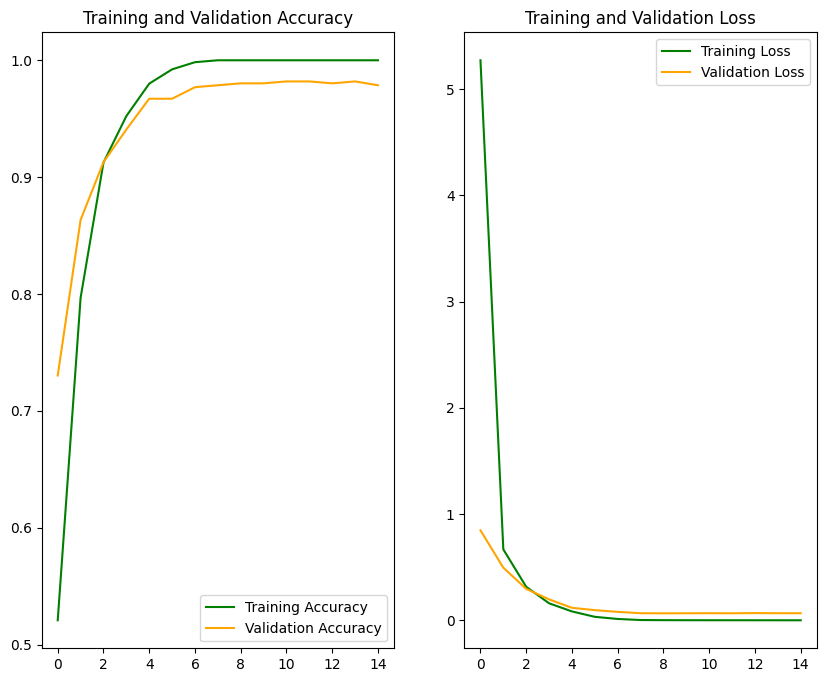

In [32]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(range(15), acc, color='green', label='Training Accuracy')
plt.plot(range(15), val_acc, color='orange', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(15), loss, color='green', label='Training Loss')
plt.plot(range(15), val_loss,color='orange', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

1/1 [==============================] - 0s 56ms/step


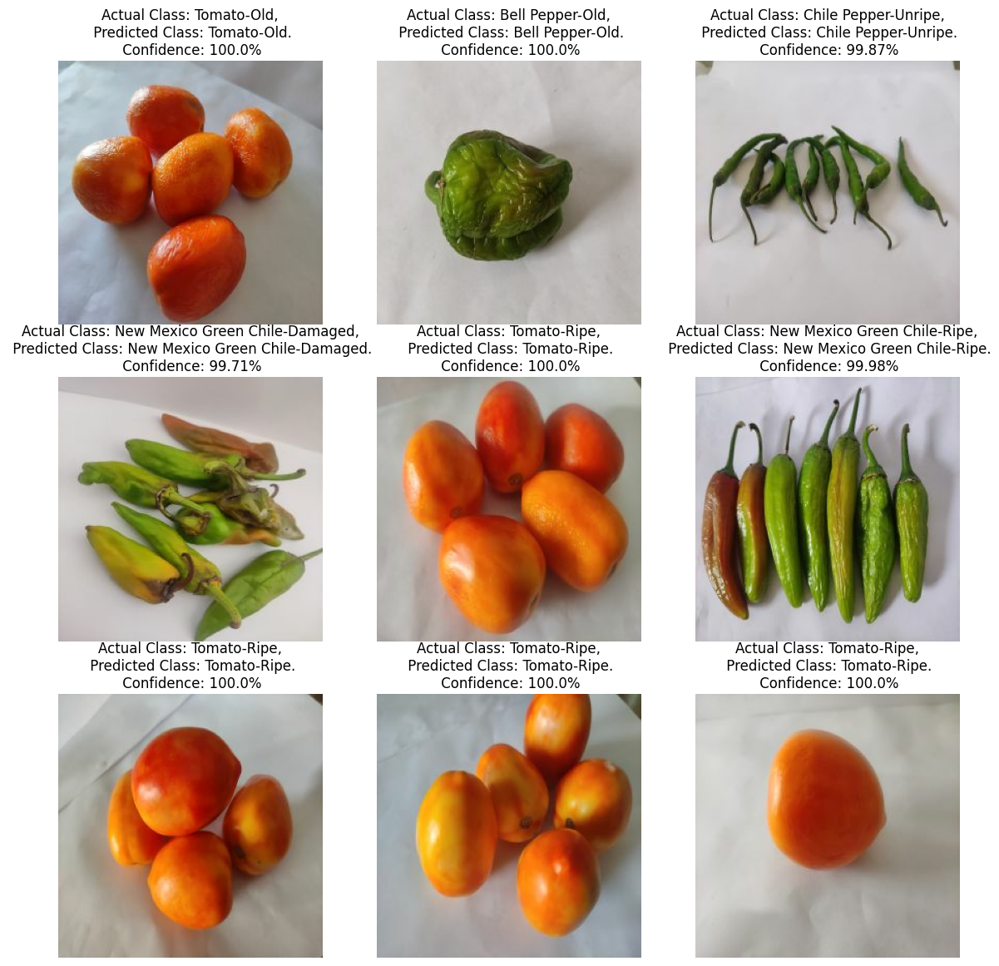

In [35]:
# Let's predict the first 9 images in the first batch
class_names = class_names

plt.figure(figsize=(14, 14))
for images, labels in test_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model7, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual Class: {actual_class},\n Predicted Class: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

1/1 [==============================] - 0s 425ms/step
                                precision    recall  f1-score   support

           Bell Pepper-Damaged       1.00      0.75      0.86         4
             Bell Pepper-Dried       1.00      1.00      1.00        31
               Bell Pepper-Old       1.00      0.97      0.99        38
              Bell Pepper-Ripe       0.96      1.00      0.98        44
            Bell Pepper-Unripe       1.00      1.00      1.00         6
          Chile Pepper-Damaged       1.00      1.00      1.00        11
            Chile Pepper-Dried       0.98      1.00      0.99        59
              Chile Pepper-Old       0.94      0.94      0.94        18
             Chile Pepper-Ripe       1.00      1.00      1.00        18
           Chile Pepper-Unripe       1.00      1.00      1.00        17
New Mexico Green Chile-Damaged       1.00      1.00      1.00        12
  New Mexico Green Chile-Dried       1.00      0.97      0.98        59
    New Me

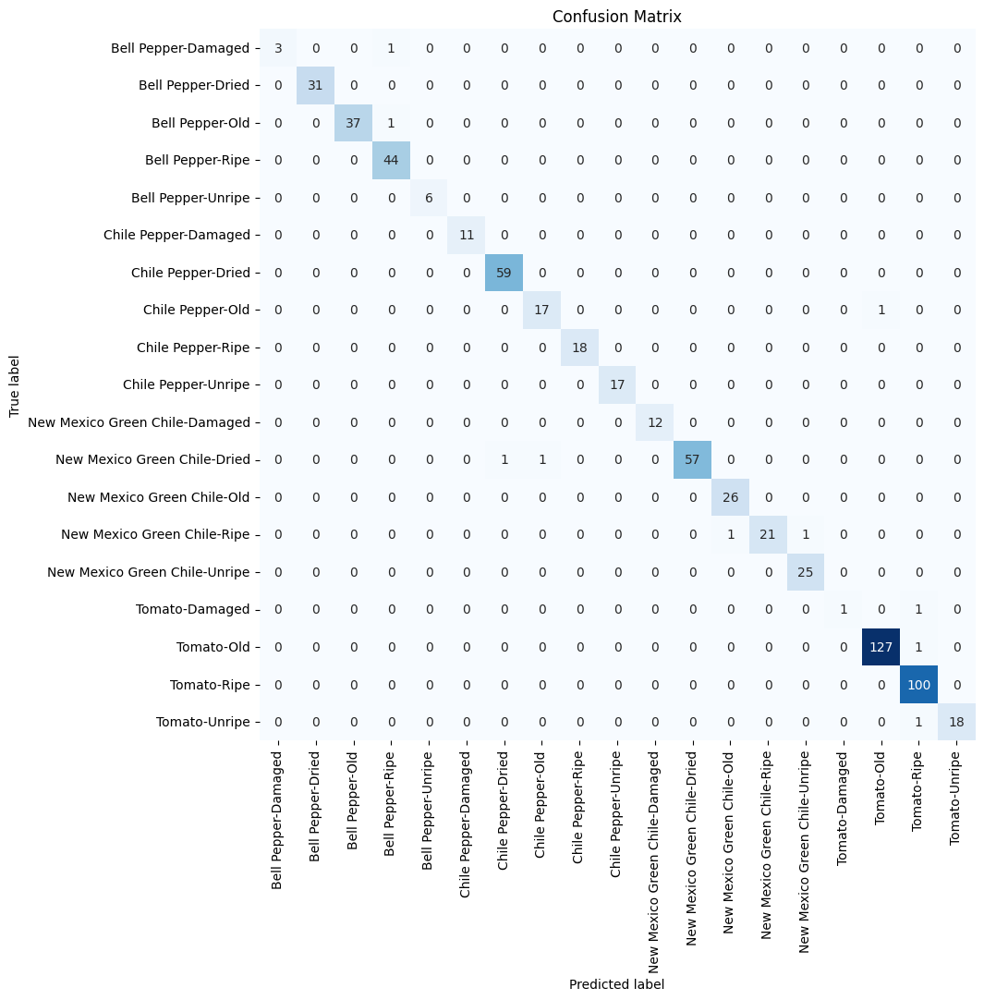

In [36]:
# Make predictions on the test set
y_pred = []
y_true = []
for images, labels in test_set:
    predictions = model7.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    y_pred.extend(predicted_labels)
    y_true.extend(labels.numpy())

# Create the confusion matrix
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xticks(np.arange(len(class_names))+0.5, class_names, rotation=90)
plt.yticks(np.arange(len(class_names))+0.5, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

# Calculate precision, recall, and f1-score for each class
from sklearn.metrics import classification_report
class_report = classification_report(y_true, y_pred, target_names=class_names)
print(class_report)

## DenseNet121

In [49]:
model8 = models.Sequential()

pretrained_model = tf.keras.applications.DenseNet121(
    include_top = False,
    input_shape = (256, 256, 3),
    classes = 19,
    weights = 'imagenet'
)

for layer in pretrained_model.layers:
    layer.trainable = False

model8.add(pretrained_model)
model8.add(layers.Flatten())
model8.add(layers.Dense(128, activation = 'relu'))
model8.add(layers.Dense(19, activation = 'softmax'))

29084464/29084464 [==============================] - 1s 0us/step


In [50]:
model8.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet121 (Functional)    (None, 8, 8, 1024)        7037504   
                                                                 
 flatten_3 (Flatten)         (None, 65536)             0         
                                                                 
 dense_6 (Dense)             (None, 128)               8388736   
                                                                 
 dense_7 (Dense)             (None, 19)                2451      
                                                                 
Total params: 15,428,691
Trainable params: 8,391,187
Non-trainable params: 7,037,504
_________________________________________________________________


In [51]:
model8.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [52]:
%%time
history8 = model8.fit(
    train_set,
    epochs=epochs,
    batch_size=32,
    verbose=1,
    validation_data=val_set
)

Epoch 1/15
154/154 [==============================] - 392s 3s/step - loss: 28.7288 - accuracy: 0.3676 - val_loss: 2.0277 - val_accuracy: 0.4424
Epoch 2/15
154/154 [==============================] - 395s 3s/step - loss: 1.9691 - accuracy: 0.4486 - val_loss: 1.7502 - val_accuracy: 0.4688
Epoch 3/15
154/154 [==============================] - 382s 2s/step - loss: 1.7910 - accuracy: 0.4694 - val_loss: 1.6651 - val_accuracy: 0.4737
Epoch 4/15
154/154 [==============================] - 378s 2s/step - loss: 1.7221 - accuracy: 0.4721 - val_loss: 1.8028 - val_accuracy: 0.4589
Epoch 5/15
154/154 [==============================] - 360s 2s/step - loss: 1.6283 - accuracy: 0.4947 - val_loss: 1.7127 - val_accuracy: 0.4786
Epoch 6/15
154/154 [==============================] - 338s 2s/step - loss: 1.7326 - accuracy: 0.4763 - val_loss: 1.5724 - val_accuracy: 0.5477
Epoch 7/15
154/154 [==============================] - 321s 2s/step - loss: 1.4501 - accuracy: 0.5516 - val_loss: 1.3980 - val_accuracy: 0.559

In [53]:
model8.save('models/model8.hdf5')

In [54]:
# Evaluate model performance on test set
score8 = model8.evaluate(test_set)

20/20 [==============================] - 49s 2s/step - loss: 1.1453 - accuracy: 0.6203


In [55]:
model8.evaluate(val_set)

19/19 [==============================] - 46s 2s/step - loss: 1.1774 - accuracy: 0.5987


[1.1774444580078125, 0.5986841917037964]

In [56]:
model8.evaluate(train_set)

154/154 [==============================] - 370s 2s/step - loss: 1.1409 - accuracy: 0.6083


[1.140882134437561, 0.6083231568336487]

In [57]:
acc = history8.history['accuracy']
val_acc = history8.history['val_accuracy']

loss = history8.history['loss']
val_loss = history8.history['val_loss']

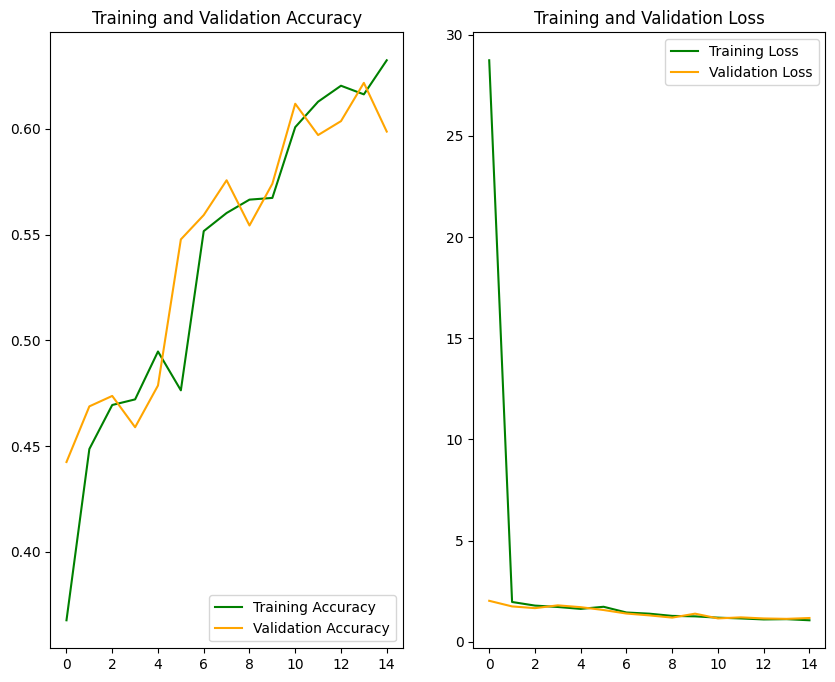

In [58]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(range(15), acc, color='green', label='Training Accuracy')
plt.plot(range(15), val_acc, color='orange', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(15), loss, color='green', label='Training Loss')
plt.plot(range(15), val_loss,color='orange', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

1/1 [==============================] - 0s 266ms/step


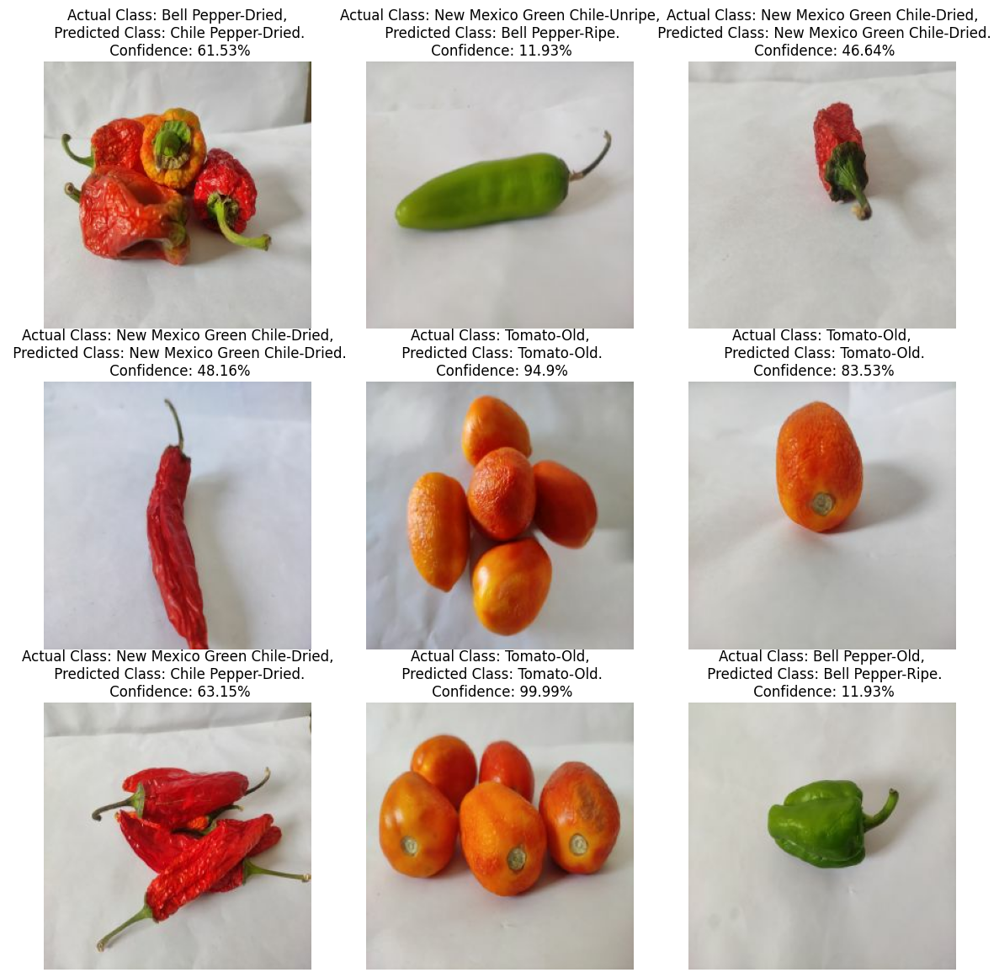

In [59]:
# Let's predict the first 9 images in the first batch
class_names = class_names

plt.figure(figsize=(14, 14))
for images, labels in test_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model8, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual Class: {actual_class},\n Predicted Class: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

1/1 [==============================] - 2s 2s/step
                                precision    recall  f1-score   support

           Bell Pepper-Damaged       0.00      0.00      0.00         4
             Bell Pepper-Dried       0.93      0.87      0.90        31
               Bell Pepper-Old       0.00      0.00      0.00        38
              Bell Pepper-Ripe       0.19      1.00      0.32        44
            Bell Pepper-Unripe       0.00      0.00      0.00         6
          Chile Pepper-Damaged       0.00      0.00      0.00        11
            Chile Pepper-Dried       0.69      0.88      0.78        59
              Chile Pepper-Old       1.00      0.11      0.20        18
             Chile Pepper-Ripe       0.00      0.00      0.00        18
           Chile Pepper-Unripe       0.00      0.00      0.00        17
New Mexico Green Chile-Damaged       0.00      0.00      0.00        12
  New Mexico Green Chile-Dried       0.61      0.61      0.61        59
    New Mexic

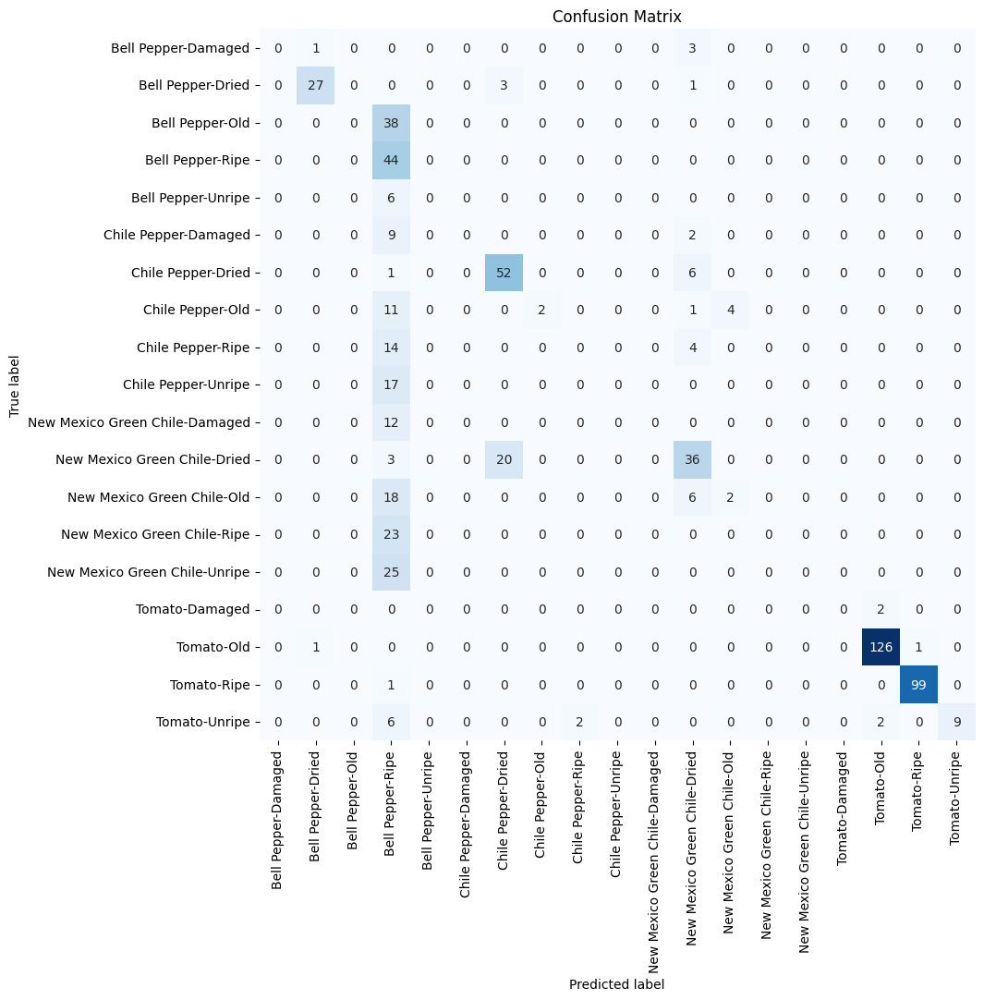

In [60]:
# Make predictions on the test set
y_pred = []
y_true = []
for images, labels in test_set:
    predictions = model8.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    y_pred.extend(predicted_labels)
    y_true.extend(labels.numpy())

# Create the confusion matrix
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xticks(np.arange(len(class_names))+0.5, class_names, rotation=90)
plt.yticks(np.arange(len(class_names))+0.5, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

# Calculate precision, recall, and f1-score for each class
from sklearn.metrics import classification_report
class_report = classification_report(y_true, y_pred, target_names=class_names)
print(class_report)

## DenseNet201

In [61]:
model9 = models.Sequential()

pretrained_model = tf.keras.applications.DenseNet201(
    include_top = False,
    input_shape = (256, 256, 3),
    classes = 19,
    weights = 'imagenet'
)

for layer in pretrained_model.layers:
    layer.trainable = False

model9.add(pretrained_model)
model9.add(layers.Flatten())
model9.add(layers.Dense(128, activation = 'relu'))
model9.add(layers.Dense(19, activation = 'softmax'))

74836368/74836368 [==============================] - 1s 0us/step


In [62]:
model9.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet201 (Functional)    (None, 8, 8, 1920)        18321984  
                                                                 
 flatten_4 (Flatten)         (None, 122880)            0         
                                                                 
 dense_8 (Dense)             (None, 128)               15728768  
                                                                 
 dense_9 (Dense)             (None, 19)                2451      
                                                                 
Total params: 34,053,203
Trainable params: 15,731,219
Non-trainable params: 18,321,984
_________________________________________________________________


In [63]:
model9.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [64]:
%%time
history9 = model9.fit(
    train_set,
    epochs=epochs,
    batch_size=32,
    verbose=1,
    validation_data=val_set
)

Epoch 1/15
154/154 [==============================] - 849s 5s/step - loss: 16.4738 - accuracy: 0.5716 - val_loss: 1.5369 - val_accuracy: 0.5822
Epoch 2/15
154/154 [==============================] - 777s 5s/step - loss: 0.9644 - accuracy: 0.7364 - val_loss: 0.7612 - val_accuracy: 0.8322
Epoch 3/15
154/154 [==============================] - 777s 5s/step - loss: 0.6225 - accuracy: 0.8333 - val_loss: 1.0491 - val_accuracy: 0.7352
Epoch 4/15
154/154 [==============================] - 749s 5s/step - loss: 0.4977 - accuracy: 0.8639 - val_loss: 0.7268 - val_accuracy: 0.8273
Epoch 5/15
154/154 [==============================] - 750s 5s/step - loss: 0.4817 - accuracy: 0.8629 - val_loss: 0.5350 - val_accuracy: 0.8520
Epoch 6/15
154/154 [==============================] - 749s 5s/step - loss: 0.4127 - accuracy: 0.8868 - val_loss: 0.4192 - val_accuracy: 0.8799
Epoch 7/15
154/154 [==============================] - 750s 5s/step - loss: 0.3610 - accuracy: 0.9039 - val_loss: 0.3515 - val_accuracy: 0.903

In [65]:
model9.save('models/model9.hdf5')

In [66]:
# Evaluate model performance on test set
score9 = model9.evaluate(test_set)

20/20 [==============================] - 88s 4s/step - loss: 0.1459 - accuracy: 0.9672


In [67]:
model9.evaluate(val_set)

19/19 [==============================] - 84s 4s/step - loss: 0.1658 - accuracy: 0.9539


[0.1658390760421753, 0.9539473652839661]

In [68]:
model9.evaluate(train_set)

154/154 [==============================] - 677s 4s/step - loss: 0.0811 - accuracy: 0.9702


[0.08109880238771439, 0.9702162146568298]

In [69]:
acc = history9.history['accuracy']
val_acc = history9.history['val_accuracy']

loss = history9.history['loss']
val_loss = history9.history['val_loss']

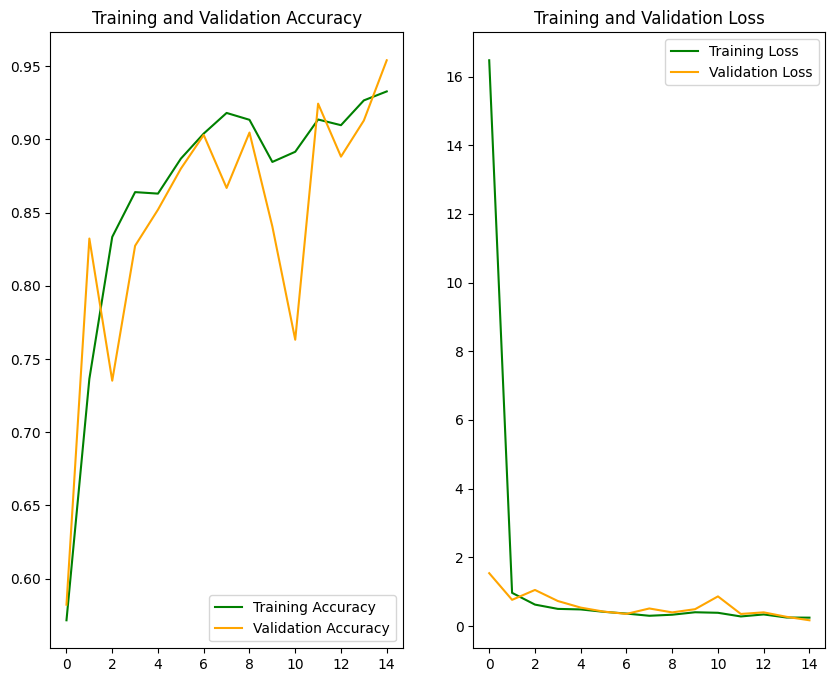

In [70]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(range(15), acc, color='green', label='Training Accuracy')
plt.plot(range(15), val_acc, color='orange', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(15), loss, color='green', label='Training Loss')
plt.plot(range(15), val_loss,color='orange', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

1/1 [==============================] - 1s 594ms/step


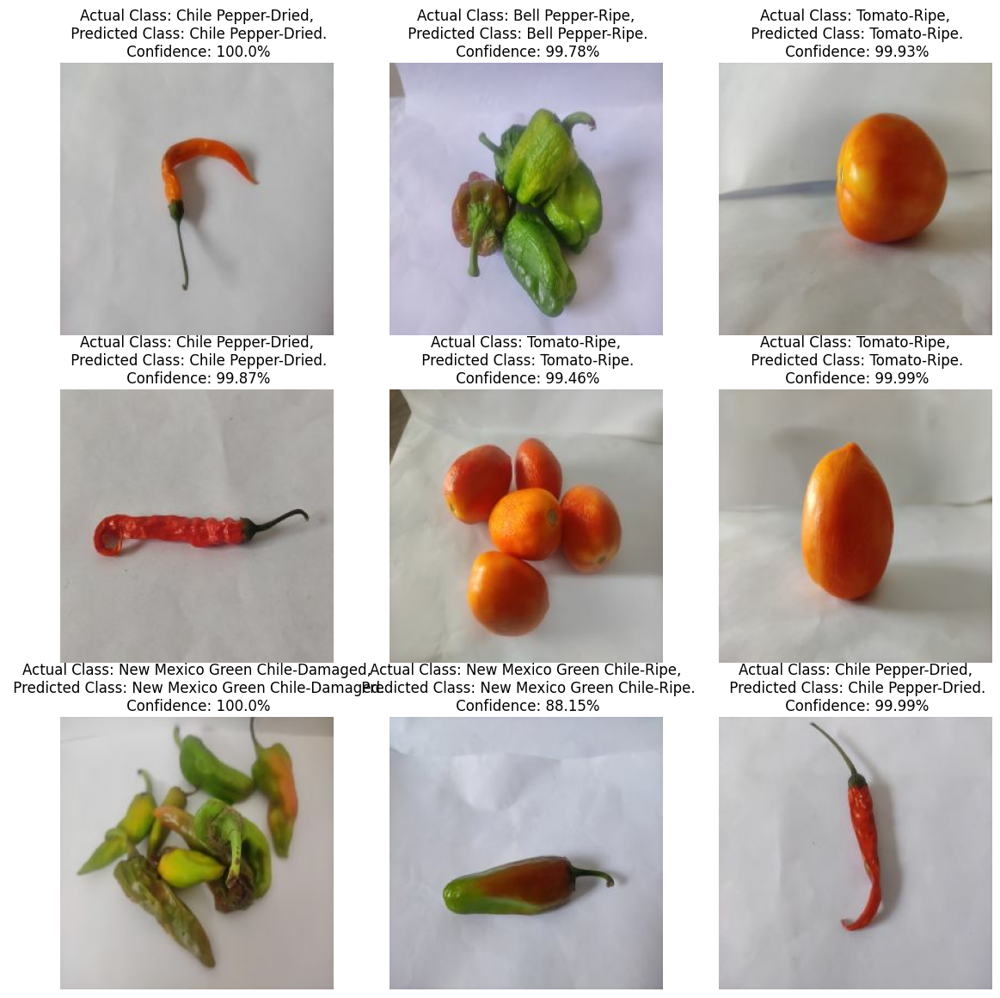

In [71]:
# Let's predict the first 9 images in the first batch
class_names = class_names

plt.figure(figsize=(14, 14))
for images, labels in test_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model9, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual Class: {actual_class},\n Predicted Class: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

1/1 [==============================] - 5s 5s/step
                                precision    recall  f1-score   support

           Bell Pepper-Damaged       0.67      0.50      0.57         4
             Bell Pepper-Dried       0.97      1.00      0.98        31
               Bell Pepper-Old       0.92      0.95      0.94        38
              Bell Pepper-Ripe       0.98      1.00      0.99        44
            Bell Pepper-Unripe       1.00      1.00      1.00         6
          Chile Pepper-Damaged       1.00      1.00      1.00        11
            Chile Pepper-Dried       0.98      0.98      0.98        59
              Chile Pepper-Old       0.89      0.94      0.92        18
             Chile Pepper-Ripe       0.94      0.89      0.91        18
           Chile Pepper-Unripe       0.94      1.00      0.97        17
New Mexico Green Chile-Damaged       1.00      1.00      1.00        12
  New Mexico Green Chile-Dried       1.00      0.95      0.97        59
    New Mexic

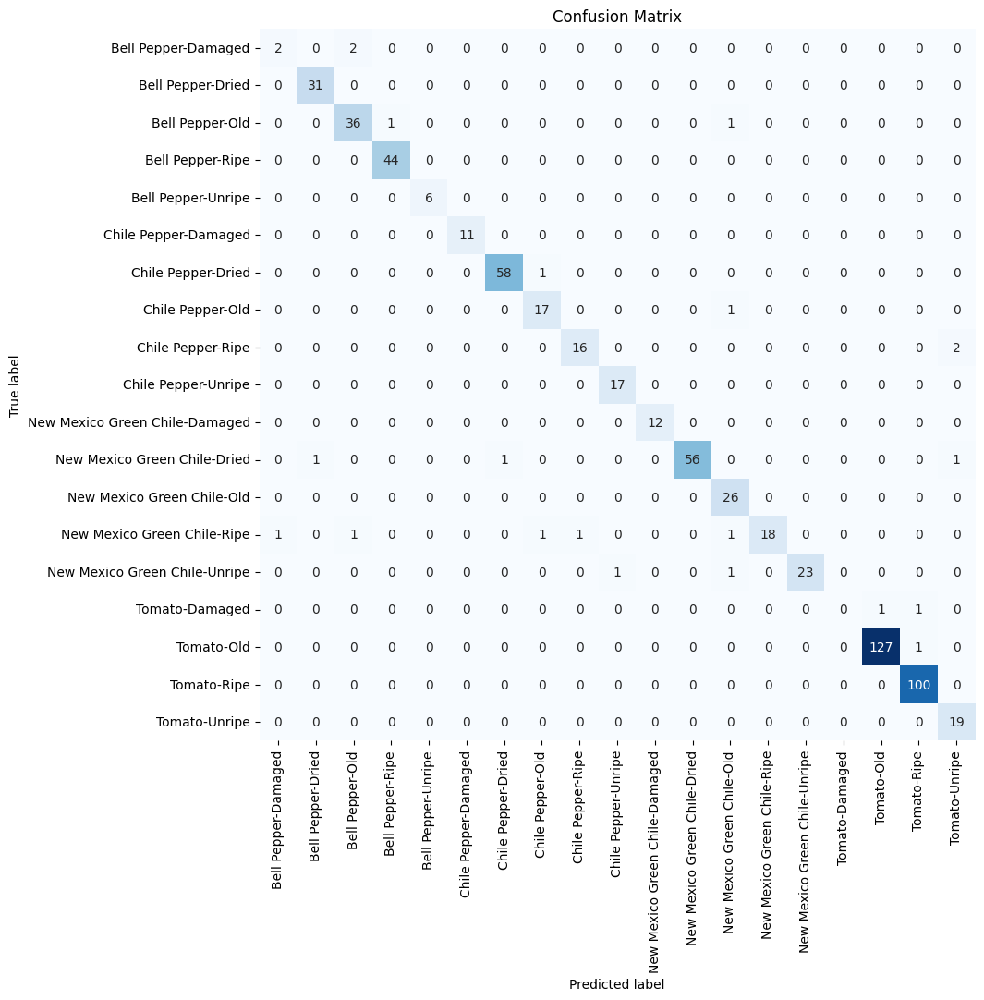

In [72]:
# Make predictions on the test set
y_pred = []
y_true = []
for images, labels in test_set:
    predictions = model9.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    y_pred.extend(predicted_labels)
    y_true.extend(labels.numpy())

# Create the confusion matrix
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xticks(np.arange(len(class_names))+0.5, class_names, rotation=90)
plt.yticks(np.arange(len(class_names))+0.5, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

# Calculate precision, recall, and f1-score for each class
from sklearn.metrics import classification_report
class_report = classification_report(y_true, y_pred, target_names=class_names)
print(class_report)

## EfficientNetB1

In [73]:
model10 = models.Sequential()

pretrained_model = tf.keras.applications.EfficientNetB1(
    include_top = False,
    input_shape = (256, 256, 3),
    classes = 19,
    weights = 'imagenet'
)

for layer in pretrained_model.layers:
    layer.trainable = False

model10.add(pretrained_model)
model10.add(layers.Flatten())
model10.add(layers.Dense(128, activation = 'relu'))
model10.add(layers.Dense(19, activation = 'softmax'))

27018416/27018416 [==============================] - 2s 0us/step


In [74]:
model10.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb1 (Functional)  (None, 8, 8, 1280)       6575239   
                                                                 
 flatten_5 (Flatten)         (None, 81920)             0         
                                                                 
 dense_10 (Dense)            (None, 128)               10485888  
                                                                 
 dense_11 (Dense)            (None, 19)                2451      
                                                                 
Total params: 17,063,578
Trainable params: 10,488,339
Non-trainable params: 6,575,239
_________________________________________________________________


In [75]:
model10.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [76]:
%%time
history10 = model10.fit(
    train_set,
    epochs=epochs,
    batch_size=32,
    verbose=1,
    validation_data=val_set
)

Epoch 1/15
154/154 [==============================] - 308s 2s/step - loss: 1.1782 - accuracy: 0.7962 - val_loss: 0.1812 - val_accuracy: 0.9424
Epoch 2/15
154/154 [==============================] - 293s 2s/step - loss: 0.1660 - accuracy: 0.9474 - val_loss: 0.1538 - val_accuracy: 0.9605
Epoch 3/15
154/154 [==============================] - 295s 2s/step - loss: 0.1039 - accuracy: 0.9694 - val_loss: 0.1104 - val_accuracy: 0.9671
Epoch 4/15
154/154 [==============================] - 294s 2s/step - loss: 0.0883 - accuracy: 0.9706 - val_loss: 0.1078 - val_accuracy: 0.9803
Epoch 5/15
154/154 [==============================] - 303s 2s/step - loss: 0.0477 - accuracy: 0.9851 - val_loss: 0.0794 - val_accuracy: 0.9819
Epoch 6/15
154/154 [==============================] - 296s 2s/step - loss: 0.0561 - accuracy: 0.9841 - val_loss: 0.0927 - val_accuracy: 0.9819
Epoch 7/15
154/154 [==============================] - 298s 2s/step - loss: 0.0792 - accuracy: 0.9800 - val_loss: 0.2219 - val_accuracy: 0.9572

In [78]:
# Evaluate model performance on test set
score10 = model10.evaluate(test_set)

20/20 [==============================] - 29s 1s/step - loss: 0.0856 - accuracy: 0.9812


In [79]:
model10.evaluate(val_set)

19/19 [==============================] - 26s 1s/step - loss: 0.1455 - accuracy: 0.9720


[0.14554649591445923, 0.9720394611358643]

In [80]:
model10.evaluate(train_set)

154/154 [==============================] - 206s 1s/step - loss: 0.0611 - accuracy: 0.9874


[0.06109181419014931, 0.9873520731925964]

In [81]:
acc = history10.history['accuracy']
val_acc = history10.history['val_accuracy']

loss = history10.history['loss']
val_loss = history10.history['val_loss']

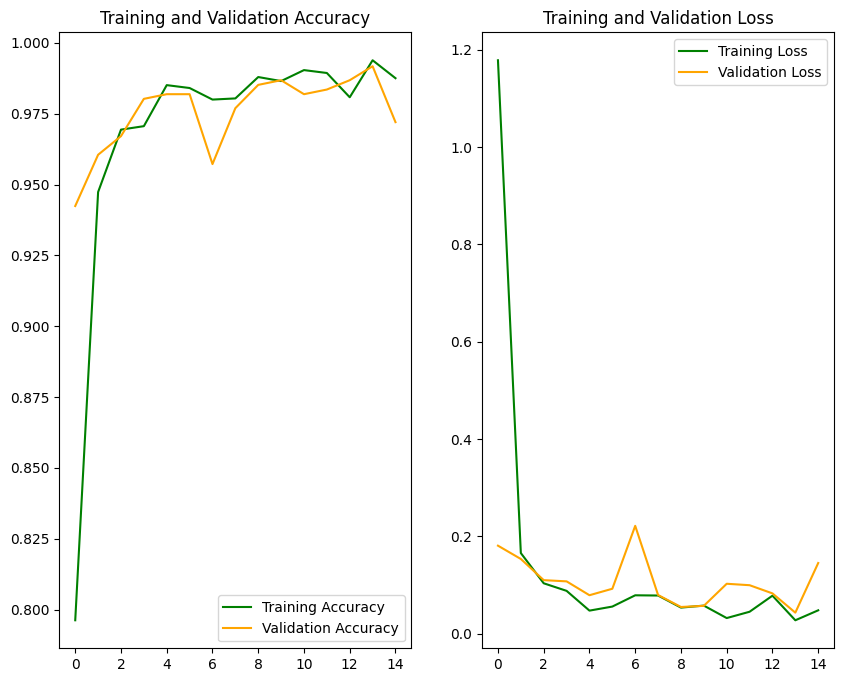

In [82]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(range(15), acc, color='green', label='Training Accuracy')
plt.plot(range(15), val_acc, color='orange', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(15), loss, color='green', label='Training Loss')
plt.plot(range(15), val_loss,color='orange', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

1/1 [==============================] - 0s 174ms/step


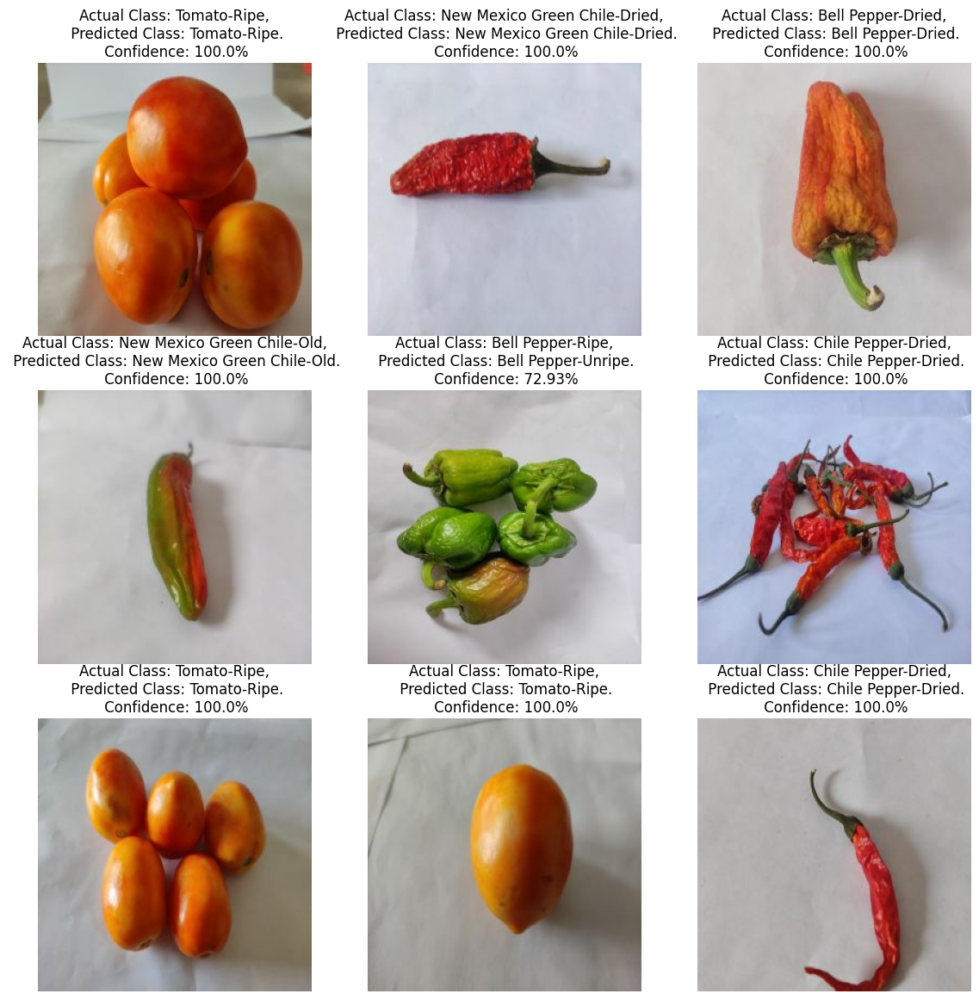

In [83]:
# Let's predict the first 9 images in the first batch
class_names = class_names

plt.figure(figsize=(14, 14))
for images, labels in test_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model10, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual Class: {actual_class},\n Predicted Class: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

1/1 [==============================] - 1s 1s/step
                                precision    recall  f1-score   support

           Bell Pepper-Damaged       1.00      1.00      1.00         4
             Bell Pepper-Dried       1.00      1.00      1.00        31
               Bell Pepper-Old       1.00      0.97      0.99        38
              Bell Pepper-Ripe       1.00      0.93      0.96        44
            Bell Pepper-Unripe       0.60      1.00      0.75         6
          Chile Pepper-Damaged       1.00      1.00      1.00        11
            Chile Pepper-Dried       1.00      1.00      1.00        59
              Chile Pepper-Old       0.90      1.00      0.95        18
             Chile Pepper-Ripe       1.00      0.89      0.94        18
           Chile Pepper-Unripe       1.00      1.00      1.00        17
New Mexico Green Chile-Damaged       1.00      0.92      0.96        12
  New Mexico Green Chile-Dried       1.00      1.00      1.00        59
    New Mexic

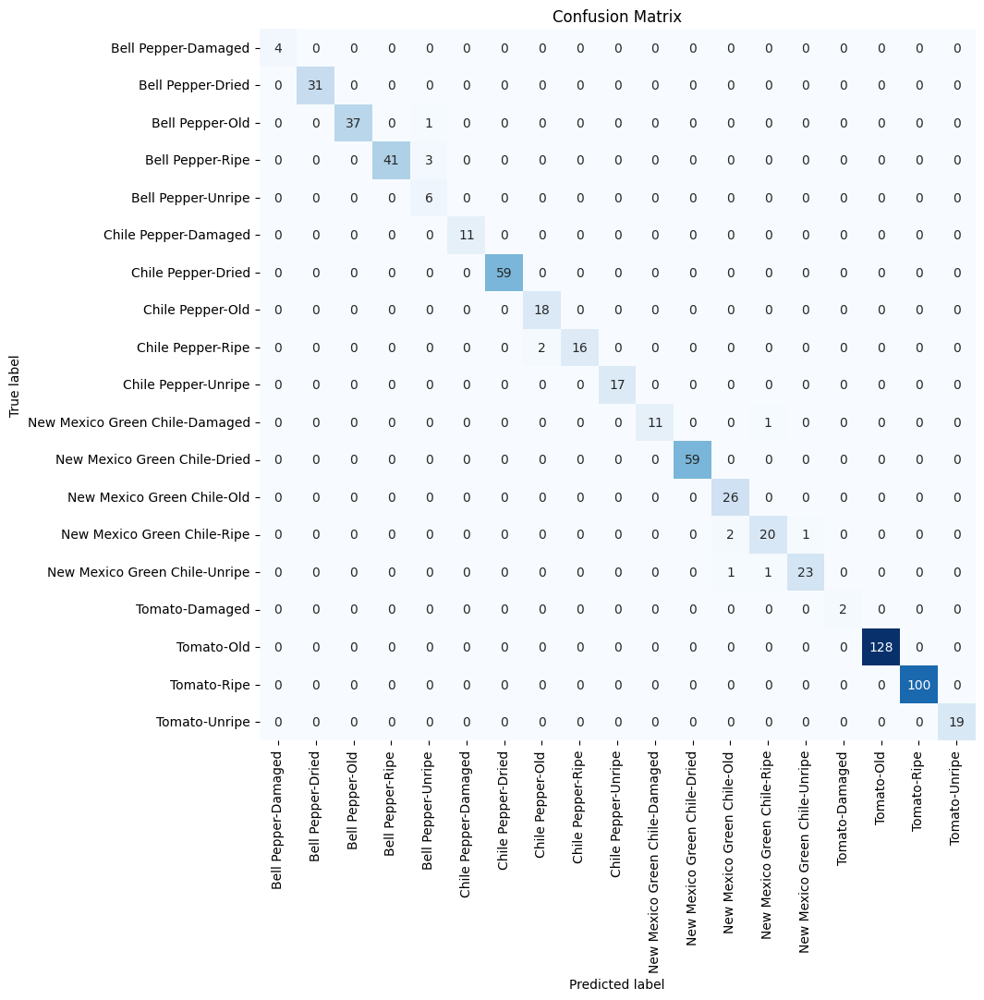

In [84]:
# Make predictions on the test set
y_pred = []
y_true = []
for images, labels in test_set:
    predictions = model10.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    y_pred.extend(predicted_labels)
    y_true.extend(labels.numpy())

# Create the confusion matrix
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xticks(np.arange(len(class_names))+0.5, class_names, rotation=90)
plt.yticks(np.arange(len(class_names))+0.5, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

# Calculate precision, recall, and f1-score for each class
from sklearn.metrics import classification_report
class_report = classification_report(y_true, y_pred, target_names=class_names)
print(class_report)

## EfficientNetB4

In [85]:
model11 = models.Sequential()

pretrained_model = tf.keras.applications.EfficientNetB4(
    include_top = False,
    input_shape = (256, 256, 3),
    classes = 19,
    weights = 'imagenet'
)

for layer in pretrained_model.layers:
    layer.trainable = False

model11.add(pretrained_model)
model11.add(layers.Flatten())
model11.add(layers.Dense(128, activation = 'relu'))
model11.add(layers.Dense(19, activation = 'softmax'))

71686520/71686520 [==============================] - 2s 0us/step


In [86]:
model11.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb4 (Functional)  (None, 8, 8, 1792)       17673823  
                                                                 
 flatten_6 (Flatten)         (None, 114688)            0         
                                                                 
 dense_12 (Dense)            (None, 128)               14680192  
                                                                 
 dense_13 (Dense)            (None, 19)                2451      
                                                                 
Total params: 32,356,466
Trainable params: 14,682,643
Non-trainable params: 17,673,823
_________________________________________________________________


In [87]:
model11.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [88]:
%%time
history11 = model11.fit(
    train_set,
    epochs=epochs,
    batch_size=32,
    verbose=1,
    validation_data=val_set
)

Epoch 1/15
154/154 [==============================] - 471s 3s/step - loss: 1.6342 - accuracy: 0.7576 - val_loss: 0.2873 - val_accuracy: 0.8980
Epoch 2/15
154/154 [==============================] - 452s 3s/step - loss: 0.2583 - accuracy: 0.9211 - val_loss: 0.1634 - val_accuracy: 0.9457
Epoch 3/15
154/154 [==============================] - 453s 3s/step - loss: 0.2343 - accuracy: 0.9455 - val_loss: 0.2633 - val_accuracy: 0.9276
Epoch 4/15
154/154 [==============================] - 453s 3s/step - loss: 0.1332 - accuracy: 0.9594 - val_loss: 0.0975 - val_accuracy: 0.9737
Epoch 5/15
154/154 [==============================] - 477s 3s/step - loss: 0.0744 - accuracy: 0.9769 - val_loss: 0.0756 - val_accuracy: 0.9720
Epoch 6/15
154/154 [==============================] - 486s 3s/step - loss: 0.0489 - accuracy: 0.9853 - val_loss: 0.0866 - val_accuracy: 0.9803
Epoch 7/15
154/154 [==============================] - 463s 3s/step - loss: 0.0767 - accuracy: 0.9782 - val_loss: 0.1387 - val_accuracy: 0.9704

In [89]:
score11 = model11.evaluate(test_set)

20/20 [==============================] - 48s 2s/step - loss: 0.0896 - accuracy: 0.9875


In [90]:
model11.evaluate(val_set)

19/19 [==============================] - 51s 3s/step - loss: 0.0596 - accuracy: 0.9901


[0.059635162353515625, 0.9901315569877625]

In [91]:
model11.evaluate(train_set)

154/154 [==============================] - 371s 2s/step - loss: 0.0315 - accuracy: 0.9945


[0.0315447598695755, 0.9944920539855957]

In [92]:
acc = history11.history['accuracy']
val_acc = history11.history['val_accuracy']

loss = history11.history['loss']
val_loss = history11.history['val_loss']

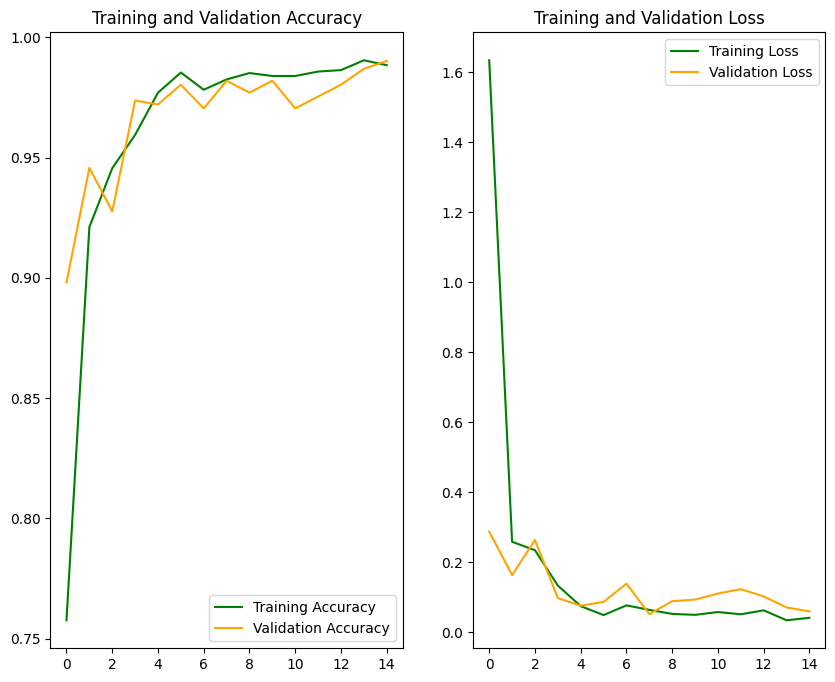

In [93]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(range(15), acc, color='green', label='Training Accuracy')
plt.plot(range(15), val_acc, color='orange', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(15), loss, color='green', label='Training Loss')
plt.plot(range(15), val_loss,color='orange', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

1/1 [==============================] - 0s 281ms/step


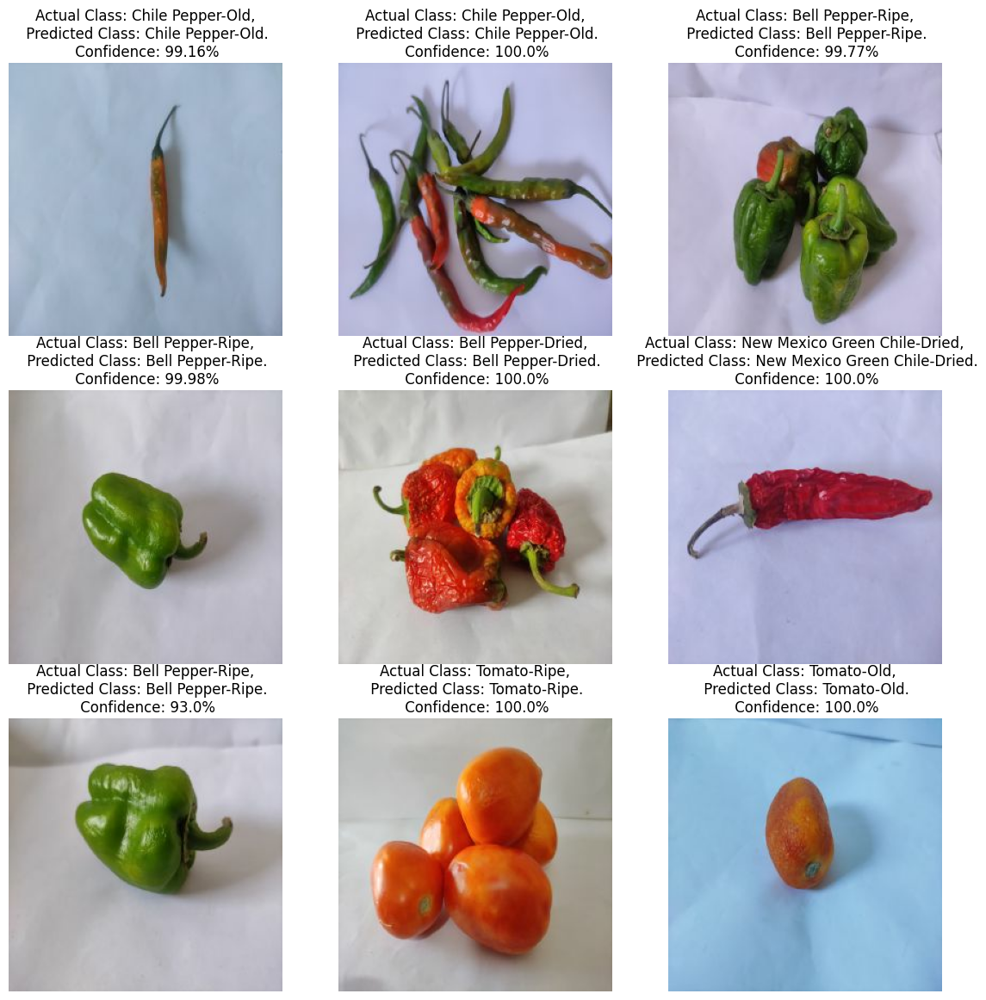

In [94]:
# Let's predict the first 9 images in the first batch
class_names = class_names

plt.figure(figsize=(14, 14))
for images, labels in test_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model11, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual Class: {actual_class},\n Predicted Class: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

1/1 [==============================] - 2s 2s/step
                                precision    recall  f1-score   support

           Bell Pepper-Damaged       1.00      1.00      1.00         4
             Bell Pepper-Dried       1.00      1.00      1.00        31
               Bell Pepper-Old       1.00      1.00      1.00        38
              Bell Pepper-Ripe       1.00      1.00      1.00        44
            Bell Pepper-Unripe       0.86      1.00      0.92         6
          Chile Pepper-Damaged       1.00      1.00      1.00        11
            Chile Pepper-Dried       1.00      1.00      1.00        59
              Chile Pepper-Old       1.00      1.00      1.00        18
             Chile Pepper-Ripe       1.00      1.00      1.00        18
           Chile Pepper-Unripe       1.00      1.00      1.00        17
New Mexico Green Chile-Damaged       1.00      1.00      1.00        12
  New Mexico Green Chile-Dried       0.95      1.00      0.98        59
    New Mexic

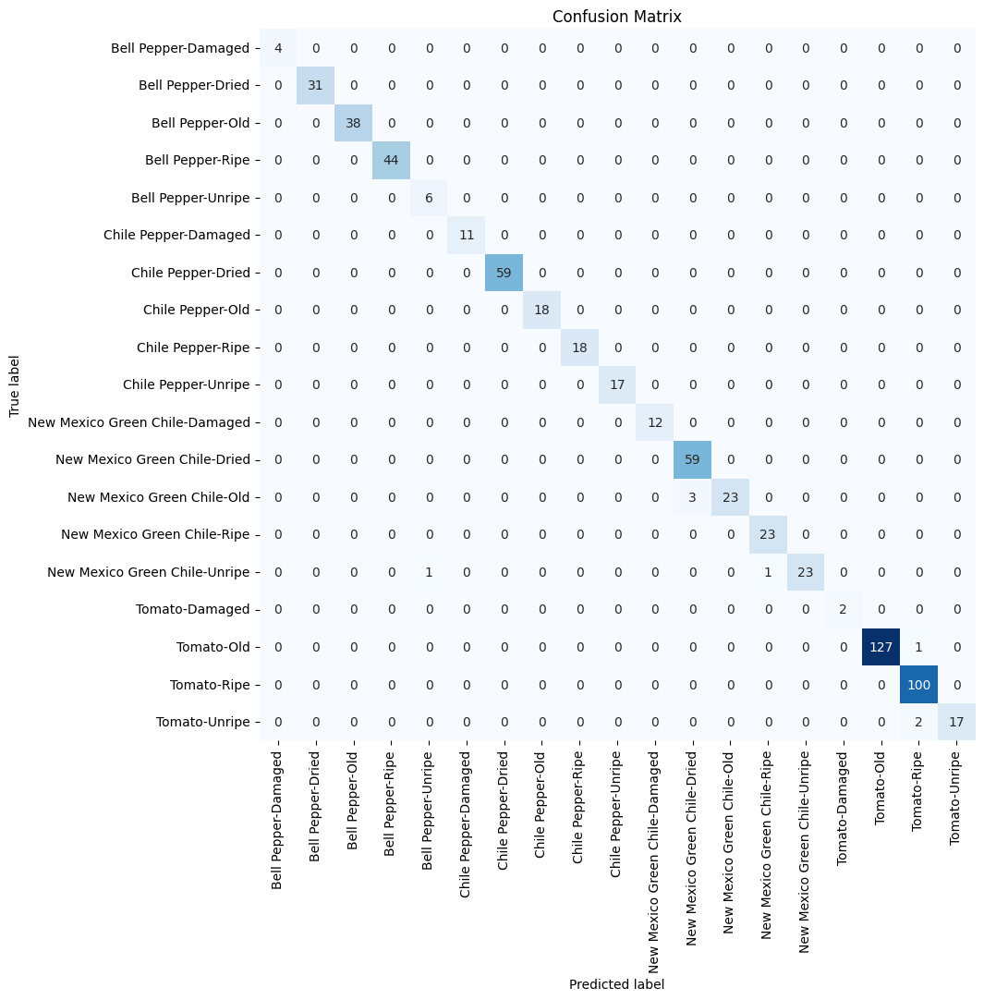

In [95]:
# Make predictions on the test set
y_pred = []
y_true = []
for images, labels in test_set:
    predictions = model11.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    y_pred.extend(predicted_labels)
    y_true.extend(labels.numpy())

# Create the confusion matrix
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xticks(np.arange(len(class_names))+0.5, class_names, rotation=90)
plt.yticks(np.arange(len(class_names))+0.5, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

# Calculate precision, recall, and f1-score for each class
from sklearn.metrics import classification_report
class_report = classification_report(y_true, y_pred, target_names=class_names)
print(class_report)

## EfficientNetB7

In [96]:
model12 = models.Sequential()

pretrained_model = tf.keras.applications.EfficientNetB7(
    include_top = False,
    input_shape = (256, 256, 3),
    classes = 19,
    weights = 'imagenet'
)

for layer in pretrained_model.layers:
    layer.trainable = False

model12.add(pretrained_model)
model12.add(layers.Flatten())
model12.add(layers.Dense(128, activation = 'relu'))
model12.add(layers.Dense(19, activation = 'softmax'))

In [97]:
model12.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb7 (Functional)  (None, 8, 8, 2560)       64097687  
                                                                 
 flatten_7 (Flatten)         (None, 163840)            0         
                                                                 
 dense_14 (Dense)            (None, 128)               20971648  
                                                                 
 dense_15 (Dense)            (None, 19)                2451      
                                                                 
Total params: 85,071,786
Trainable params: 20,974,099
Non-trainable params: 64,097,687
_________________________________________________________________


In [98]:
model12.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [103]:
%%time
history12 = model12.fit(
    train_set,
    epochs=epochs,
    batch_size=32,
    verbose=1,
    validation_data=val_set
)

Epoch 1/15
154/154 [==============================] - 1317s 9s/step - loss: 1.7177 - accuracy: 0.7003 - val_loss: 0.4817 - val_accuracy: 0.8322
Epoch 2/15
154/154 [==============================] - 1305s 8s/step - loss: 0.4247 - accuracy: 0.8735 - val_loss: 0.3030 - val_accuracy: 0.8947
Epoch 3/15
154/154 [==============================] - 1289s 8s/step - loss: 0.2495 - accuracy: 0.9164 - val_loss: 0.1175 - val_accuracy: 0.9539
Epoch 4/15
154/154 [==============================] - 1268s 8s/step - loss: 0.1650 - accuracy: 0.9404 - val_loss: 0.1108 - val_accuracy: 0.9556
Epoch 5/15
154/154 [==============================] - 1164s 8s/step - loss: 0.1899 - accuracy: 0.9370 - val_loss: 0.2155 - val_accuracy: 0.9276
Epoch 6/15
154/154 [==============================] - 1219s 8s/step - loss: 0.1347 - accuracy: 0.9549 - val_loss: 0.0953 - val_accuracy: 0.9605
Epoch 7/15
154/154 [==============================] - 1224s 8s/step - loss: 0.1472 - accuracy: 0.9590 - val_loss: 0.0886 - val_accuracy:

In [100]:
# Evaluate model performance on test set
score12 = model12.evaluate(test_set)

20/20 [==============================] - 138s 7s/step - loss: 17.6855 - accuracy: 0.3484


In [101]:
model12.evaluate(val_set)

19/19 [==============================] - 126s 7s/step - loss: 18.8508 - accuracy: 0.2911


[18.85076332092285, 0.29111841320991516]

In [ ]:
acc = history12.history['accuracy']
val_acc = history12.history['val_accuracy']

loss = history12.history['loss']
val_loss = history12.history['val_loss']

In [ ]:
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(range(15), acc, color='green', label='Training Accuracy')
plt.plot(range(15), val_acc, color='orange', label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(15), loss, color='green', label='Training Loss')
plt.plot(range(15), val_loss,color='orange', label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
# Let's predict the first 9 images in the first batch
class_names = class_names

plt.figure(figsize=(14, 14))
for images, labels in test_set.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model12, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual Class: {actual_class},\n Predicted Class: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

In [ ]:
# Make predictions on the test set
y_pred = []
y_true = []
for images, labels in test_set:
    predictions = model12.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    y_pred.extend(predicted_labels)
    y_true.extend(labels.numpy())

# Create the confusion matrix
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xticks(np.arange(len(class_names))+0.5, class_names, rotation=90)
plt.yticks(np.arange(len(class_names))+0.5, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

# Calculate precision, recall, and f1-score for each class
from sklearn.metrics import classification_report
class_report = classification_report(y_true, y_pred, target_names=class_names)
print(class_report)